### To run this notebook:
conda activate traffic

jupyter lab

In [13]:
from pitot.geodesy import bearing, distance, destination
from traffic.data import samples
from numpy.random import default_rng
from cartes.crs import Mercator
from geopy import distance as geopyDistance
from filterpy.kalman import KalmanFilter, rts_smoother
import copy
import numpy as np
import math
import random
import warnings
import pyproj
import copy
import sys
import ipywidgets as widgets

from helperFunctions.plot import * # My helper functions
from helperFunctions.tools import * # My helper functions


warnings.filterwarnings('ignore')

# Task 2: Plotting Ground Truth Data

In [14]:
# needed for set_lat_lon_from_x_y below
# is set by get_ground_truth_data()
projection_for_flight = {}


def get_ground_truth_data():
    """ returns a dict of flight_id -> flight with flight data containing the original GPS data
     resampled to 10s (with one position every 10s)
    """
    names = ['liguria', 'pixair_toulouse', 'indiana', 'texas', 'georeal_fyn_island', 'ign_mercantour',
             'ign_fontainebleau', 'mecsek_mountains', 'ign_lot_et_garonne', 'inflight_refuelling', 'aircraft_carrier',
             'luberon', 'alto_adige', 'franconia', 'danube_valley', 'cevennes', 'oxford_cambridge', 'alpi_italiane',
             'rega_zh', 'samu31', 'rega_sg', 'monastir', 'guatemala', 'london_heathrow', 'cardiff', 'sydney',
             'brussels_ils', 'ajaccio', 'toulouse', 'noumea', 'london_gatwick', 'perth', 'kota_kinabalu', 'montreal',
             'funchal', 'nice', 'munich', 'vancouver', 'lisbon', 'liege_sprimont', 'kiruna', 'bornholm', 'kingston',
             'brussels_vor', 'vienna', 'border_control', 'dreamliner_boeing', 'texas_longhorn', 'zero_gravity',
             'qantas747', 'turkish_flag', 'airbus_tree', 'easter_rabbit', 'belevingsvlucht', 'anzac_day', 'thankyou',
             'vasaloppet'];

    flights = {}
    i = 0
    for x in names:
        flight = samples.__getattr__(x)
        if not flight:
            print("name %s does not work" % x)
        flight = flight.assign(flight_id=f"{flight.callsign}_{i:03}")
        #print("reading data of flight: %s" % flight.flight_id)
        projection = pyproj.Proj(proj="lcc", ellps="WGS84",
                                 lat_1=flight.data.latitude.min(), lat_2=flight.data.latitude.max(),
                                 lon_1=flight.data.longitude.min(), lon_2=flight.data.longitude.max(),
                                 lat_0=flight.data.latitude.mean(), lon_0=flight.data.longitude.mean())
        if flight.flight_id in projection_for_flight:
            print("ERROR: duplicate flight ids: %s" % flight.flight_id)
        flights[flight.flight_id] = flight
        projection_for_flight[flight.flight_id] = projection
        #print("reading data of flight: %s" % flight.flight_id)
        i += 1
    return flights;

# a dict mapping flight_id -> (lat, lon), where lat, lon is the position of the (fake) radar that was used to create
#  the radar data for the respective flight
radar_position = {}


def radarData(flight):
    """
    radarData(flight) returns a copy of the given flight, but with the position data (lat, lon,
    altitude, x, y) modified as if it was a reading from a radar, i.e., the data is less accurate and with fewer points
    than the one from get_ground_truth_data().
    The resulting flight will have x, y coordinates set to suitable 2d projections of the lat/lon positions.
    You can access these coordinates in the flight.data attribute, which is a Pandas DataFrame.
    In the resulting flight there is one position every 10 seconds.
    """

    #  1. set parameters: angular error (probably around 1 degree), distance error (probably between 50 - 300m)
    #     see: https://aviation.stackexchange.com/questions/115/what-is-the-range-and-accuracy-of-atc-radar-systems
    #  2. put a radar in position for the flight (e.g., in the middle)
    #  3. for each point in the flight:
    #     - compute distance and bearing to the radar
    #     - add a random angle to the bearing and a random distance to the distance
    #     - compute new position based on new azimuth and distance
    #     - add a random difference to the altitude

    azimuth_error = 1  # in degrees
    distance_error = 100  # in meters
    altitude_angle_error = 1 * math.pi / 180  # 1 degree in radians
    rng = default_rng()
    # place the radar in a random point somewhere in area of the flight
    radar_lat = rng.uniform(flight.data.latitude.min(), flight.data.latitude.max())
    radar_lon = rng.uniform(flight.data.longitude.min(), flight.data.longitude.max())
    # TODO: store radar position for the flight and put it into the plot for reference
    # print("flight: %s" % flight.flight_id)
    flight_radar = flight.resample("10s")
    radar_position[flight.flight_id] = (radar_lat, radar_lon)
    flight_radar.__setattr__("radar_position", (radar_lat, radar_lon))
    for i in range(len(flight_radar.data)):
        lat = flight_radar.data.at[i, "latitude"]
        lon = flight_radar.data.at[i, "longitude"]
        bearing_to_point = bearing(radar_lat, radar_lon, lat, lon)
        dist_to_point = distance(radar_lat, radar_lon, lat, lon)
        bearing_to_point += rng.normal() * azimuth_error
        dist_to_point += rng.normal() * distance_error
        (flight_radar.data.at[i, "latitude"], flight_radar.data.at[i, "longitude"], _) = \
            destination(lat=radar_lat, lon=radar_lon, bearing=bearing_to_point, distance=dist_to_point)
        height_angle = math.atan(flight_radar.data.at[i, "altitude"] / dist_to_point)  # in radians
        height_angle += rng.normal() * altitude_angle_error
        flight_radar.data.at[i, "altitude"] = math.tan(height_angle) * dist_to_point
    projection = projection_for_flight[flight.flight_id]
    flight_radar = flight_radar.compute_xy(projection)
    return flight_radar;


def get_radar_data_all_flights(ground_truth_flights): # This returns all the flights.
    # Use get radar data for flight instead for a single flight.
    """ get_radar_data(ground_truth_flights) returns dict mapping of flight_id -> flight with flight data containing the
    (fake) radar data computed for each of the flights
    """
    radar_data = {flight_id: radarData(flight) for flight_id, flight in ground_truth_flights.items()}
    #for rData in radar_data:
    #    print(radar_data[rData])
    
    return radar_data;

def set_lat_lon_from_x_y(flight, projection_for_flight):
    """
    set_lat_lon_from_x_y(flight) updates the given flight's latitudes and longitudes to reflect its x, y positions
    in the data.
    The intended use of this function is to:
      1. make a (deep) copy of a flight that you got from get_radar_data
      2. use a kalman filter on that flight and set the x, y columns of the data to the filtered positions
      3. call set_lat_lon_from_x_y() on that flight to set its latitude and longitude columns according to the
        filtered x,y positions
    Step 3 is necessary, if you want to plot the data, because plotting is based on the lat/lon coordinates and not
    based on x,y.

    :param flight:
    :return: the same flight
    """
    projection = projection_for_flight[flight.flight_id];
    if projection is None:
        print("No projection found for flight %s. You probably did not get this flight from get_radar_data()." % (
            flight.flight_id))

    lons, lats = projection(flight.data["x"], flight.data["y"], inverse=True);
    flight.data["longitude"] = lons;
    flight.data["latitude"] = lats;
    return flight;
groundTruthData = get_ground_truth_data();
allRadarData = get_radar_data_all_flights(groundTruthData);

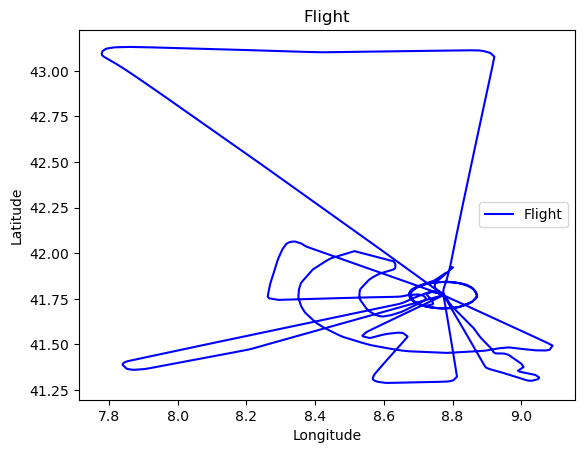

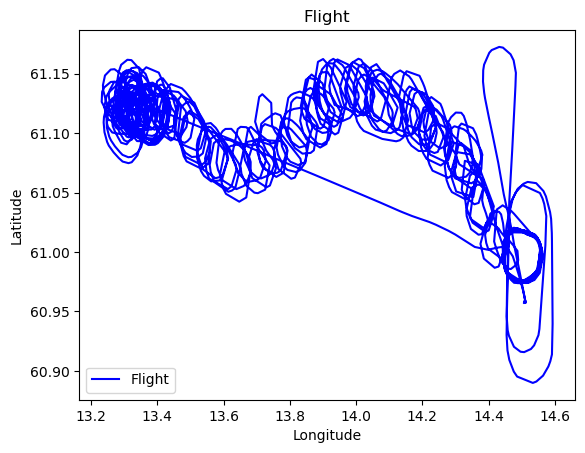

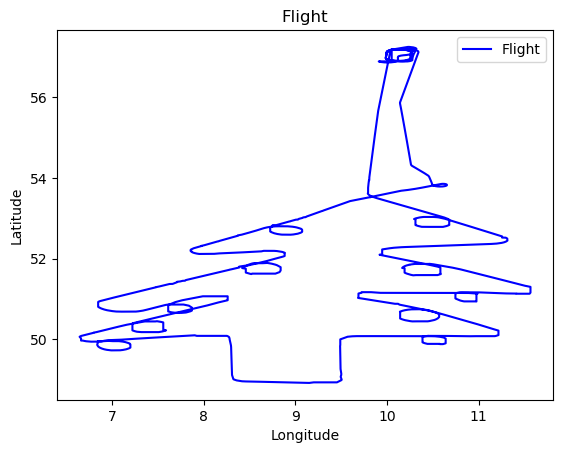

In [15]:
# Some examples
plotFlightLongitudeLatitude(groundTruthData['CALIBRA_027'])
plotFlightLongitudeLatitude(groundTruthData['OOLET_056'])
plotFlightLongitudeLatitude(groundTruthData['AIB232E_051'])

# Uncomment the following to plot all flights.
'''
for flightID in groundTruthData:
    print(flightID)
    plotFlightLongitudeLatitude(groundTruthData[flightID])
''';

# Task 3: Plotting Radar Data

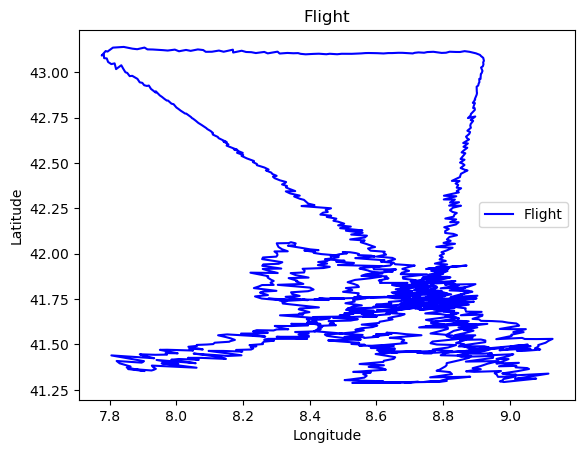

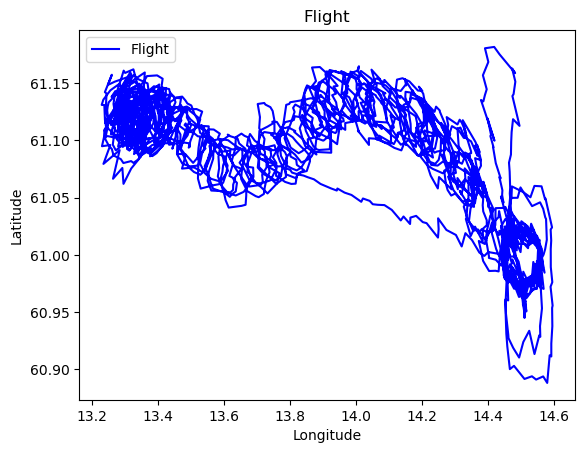

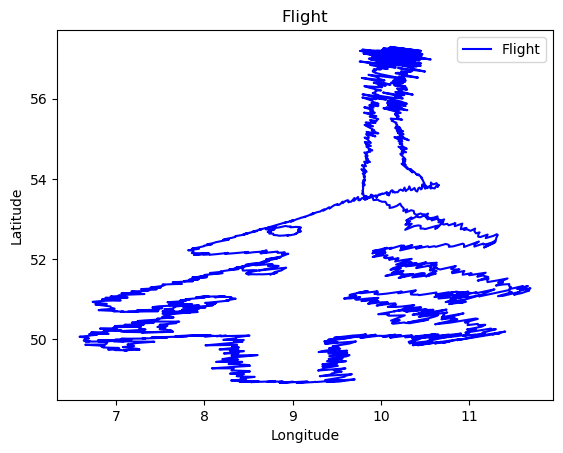

In [16]:
# Some examples
plotFlightLongitudeLatitude(allRadarData['CALIBRA_027'])
plotFlightLongitudeLatitude(allRadarData['OOLET_056'])
plotFlightLongitudeLatitude(allRadarData['AIB232E_051'])

# Uncomment the following to plot all flights.
'''
for flightID in allRadarData:
    print(flightID)
    plotFlightLongitudeLatitude(allRadarData[flightID])
''';

In [17]:
print("These are all the flights available:")
for index, key in enumerate(groundTruthData):
    print(f'{str(index+1)}. {key}')

These are all the flights available:
1. IGRAD_000
2. PXR31F_001
3. N441FS_002
4. N441FS_003
5. OKVOK_004
6. FGALN_005
7. FGALN_006
8. HAYCG_007
9. FGALN_008
10. FAF4011_009
11. PSWRD35_010
12. F-CHDN_011
13. D-KRPK_012
14. D-6567_013
15. SS_014
16. F-CIJO_015
17. G-CLPU_016
18. D-KWFW_017
19. REGA1_018
20. SAMU31_019
21. REGA1_020
22. CALIBRA_021
23. YS111N_022
24. VOR05_023
25. GTACN_024
26. ADA4_025
27. CALIBRA_026
28. CALIBRA_027
29. CALIBRA_028
30. CALIBRA_029
31. GTACN_030
32. ADA4_031
33. 9MFCL_032
34. NVC201_033
35. VOR05_034
36. CALIBRA_035
37. FCK211_036
38. NVC103_037
39. VOR05_038
40. CALIBRA_039
41. CFL12_040
42. CFL12_041
43. YS111N_042
44. CALIBRA_043
45. FCK211_044
46. GTEKV_045
47. BOE004_046
48. N56821_047
49. ZEROG_048
50. QFA7474_049
51. THY1920_050
52. AIB232E_051
53. DMUPY_052
54. TRA051_053
55. VHOMS_054
56. HAXAE_055
57. OOLET_056


# Task 4: Implementation of Kalman Filter

In [18]:
# State vector x
    # positionX = 0 # Input from data: flight.data.x[0]; use radar data
    # positionY = 0 # Input from data: flight.data.y[0]; use radar data
    # We are tracking X and Y, so can throw away velocities. (Z will have dimension 2)
positionX = None # We will set it later
positionY = None # We will set it later
velocityX = 10 # We set an initial velocity of 10
velocityY = 10 # We set an initial velocity of 10
x = np.array([positionX, positionY, velocityX, velocityY])



# Unit time
dt = 10



# State Transition Matrix F
    # Theoretical computation of the next state from current state.
F = np.array([[1, 0, dt, 0],
              [0, 1, 0, dt],
              [0, 0, 1, 0],
              [0, 0, 0, 1]])



# Process Covariance Matrix P
    # By question, we put in reasonable values for the initial process covariance matrix
initialPositionSigma2 = 1500
initialVelocitySigma2 = 30
P = np.array([[initialPositionSigma2, 0, 0, 0],
          [0, initialPositionSigma2, 0, 0],
          [0, 0, initialVelocitySigma2, 0],
          [0, 0, 0, initialVelocitySigma2]])



# Process Noise Covariance Matrix Q
    # sigmaP = standard deviation of process noise (sigmaP)
    # Here i use a function. This is in conjunction with the slider widget later on.
sigmaP = 1.5
def buildQ(sigmaP):
    return np.array([[0.25*(dt**4)*sigmaP**2, 0, 0.5*(dt**3)*sigmaP**2, 0],
                      [0, 0.25*(dt**4)*sigmaP**2, 0, 0.5*(dt**3)*sigmaP**2],
                      [0.5*(dt**3)*sigmaP**2, 0, (dt**2)*sigmaP**2, 0],
                      [0, 0.5*(dt**3)*sigmaP**2, 0, (dt**2)*sigmaP**2]])
Q = buildQ(sigmaP)



# Measurement Noise Covariance Matrix R
    # sigmaO = standard deviation of the measurement noise (sigmaO)
    # Here i use a function. This is in conjunction with the slider widget later on.
sigmaO = 100
def buildR(sigmaO):
    return np.array([[sigmaO**2, 0],
                    [0, sigmaO**2]])
R = buildR(sigmaO)



# Measurement z and matrix H (to convert state vector form to measurement form)
zDimensions = 2
H = np.array([[1, 0, 0, 0],
              [0, 1, 0, 0]])



def buildKalmanFilter(x, zDimensions, F, P, Q, R, H):
    kf = KalmanFilter(dim_x=x.shape[0], dim_z= zDimensions)
    kf.x = x
    kf.F = F
    kf.P = P
    kf.Q = Q
    kf.R = R
    kf.H = H
    return kf



def kalmanFilterPredictUpdateProcess(kf, flight):
    # We will iterate, predict, update the state vector for each row of data
    predictions = [] # We store the data to update the X, Y and plot
    xy= getXYFromFlight(flight)
    for data in xy:
        z = data
        kf.predict()
        kf.update(z)
        predictions.append(kf.x[:2]) # x[:2] as we only want the first two elements - x and y positions
        
    return np.array(predictions)


# Task 5: Ground truth data vs predicted radar for all flights

Flight IGRAD_000


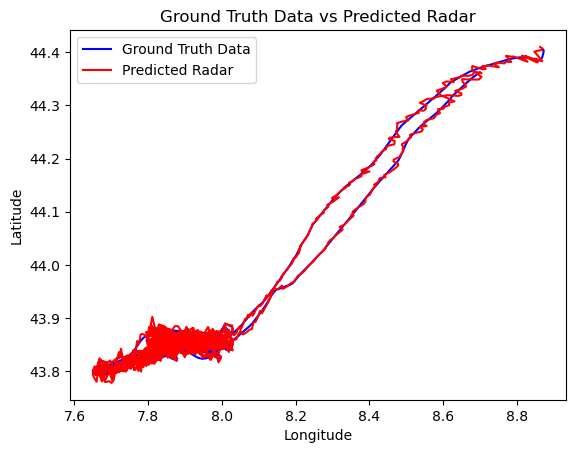

Flight PXR31F_001


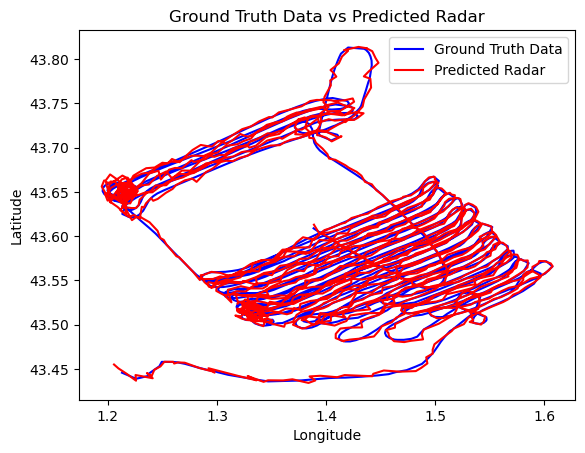

Flight N441FS_002


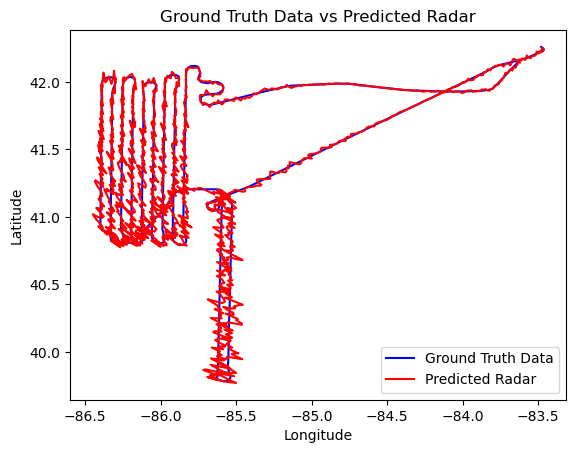

Flight N441FS_003


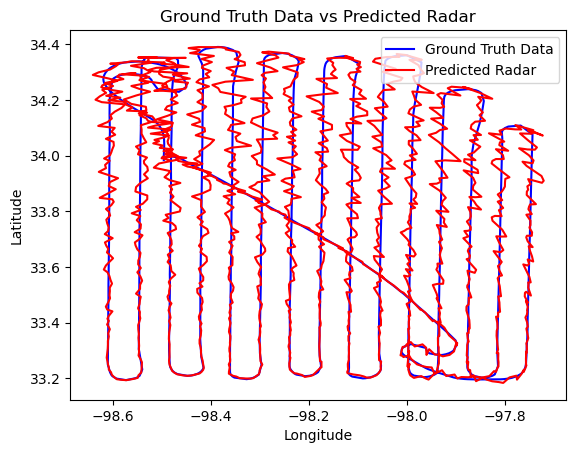

Flight OKVOK_004


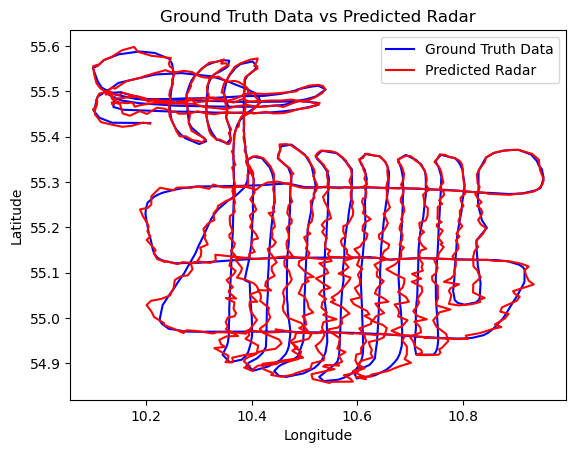

Flight FGALN_005


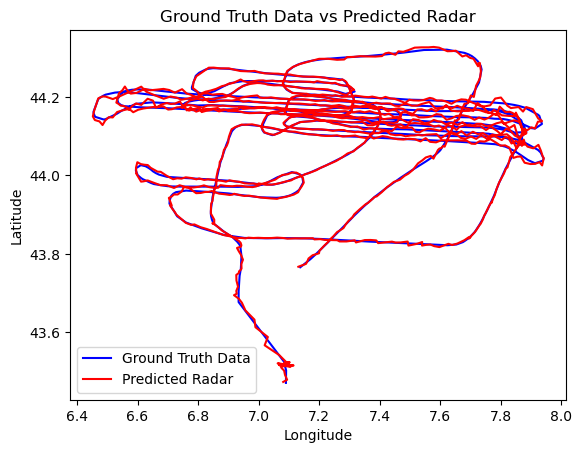

Flight FGALN_006


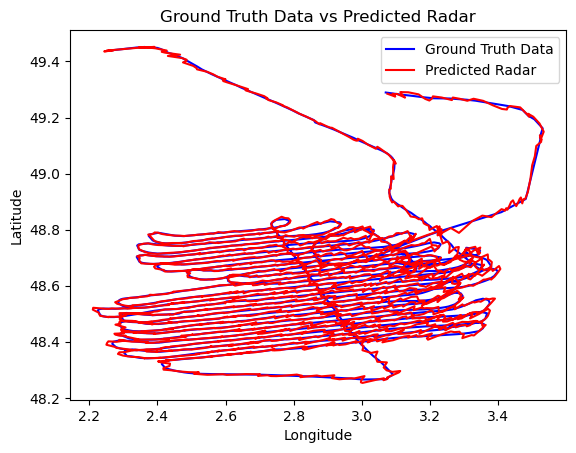

Flight HAYCG_007


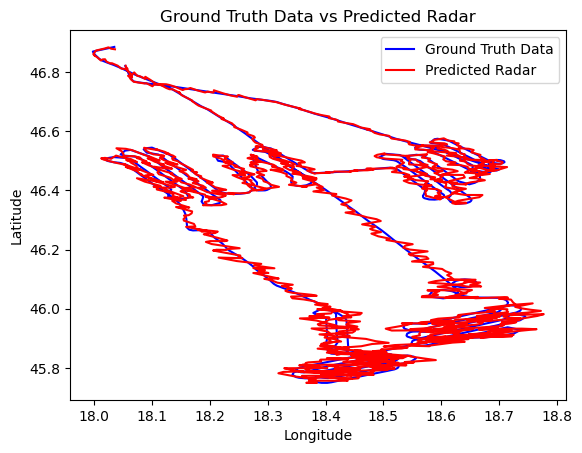

Flight FGALN_008


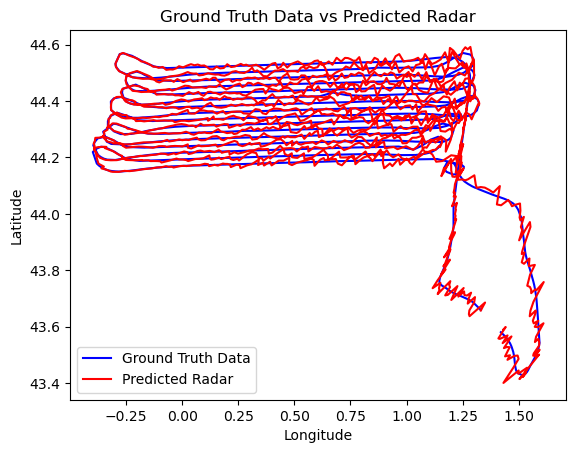

Flight FAF4011_009


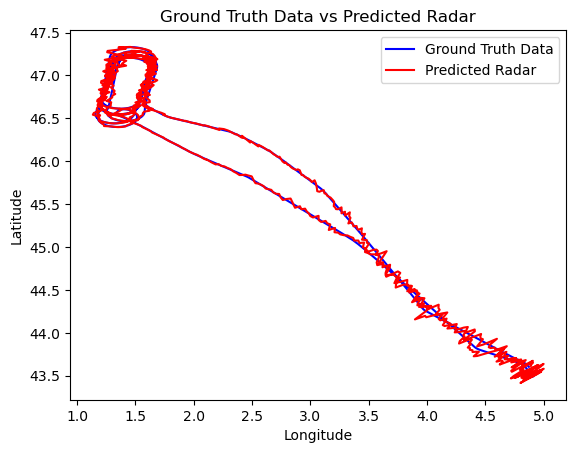

Flight PSWRD35_010


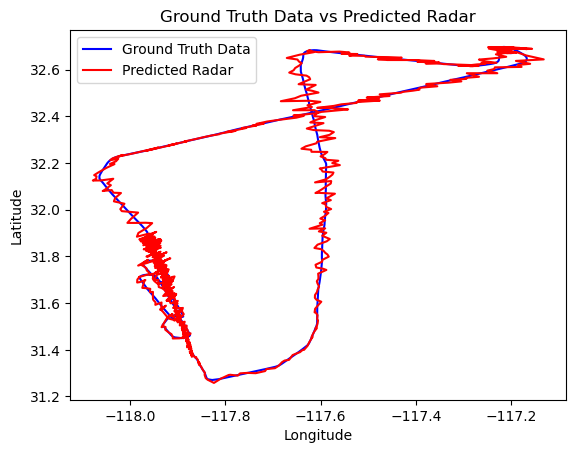

Flight F-CHDN_011


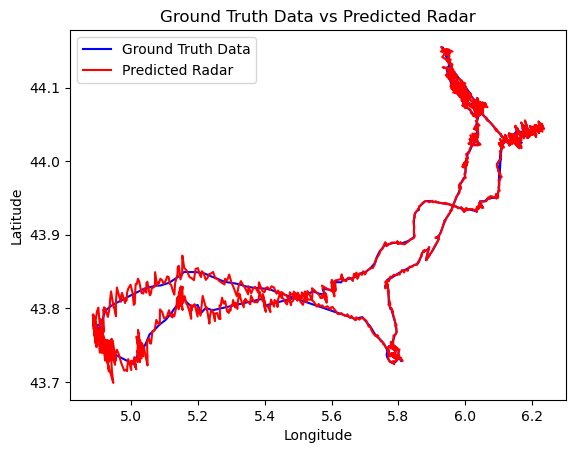

Flight D-KRPK_012


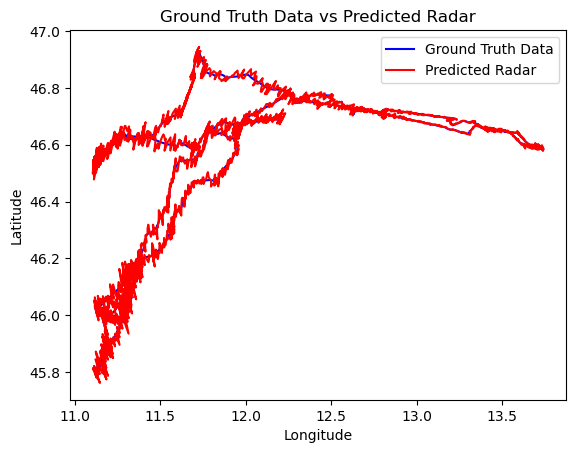

Flight D-6567_013


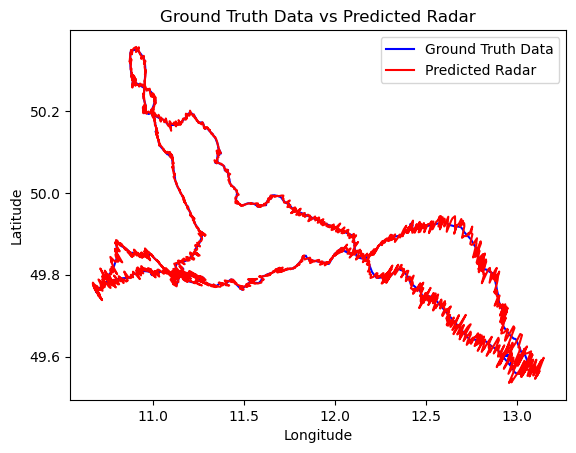

Flight SS_014


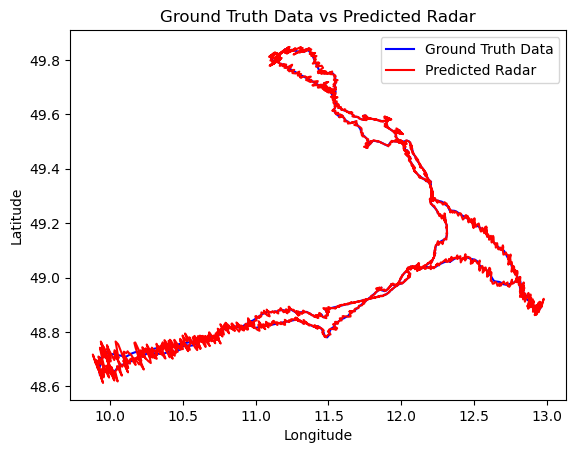

Flight F-CIJO_015


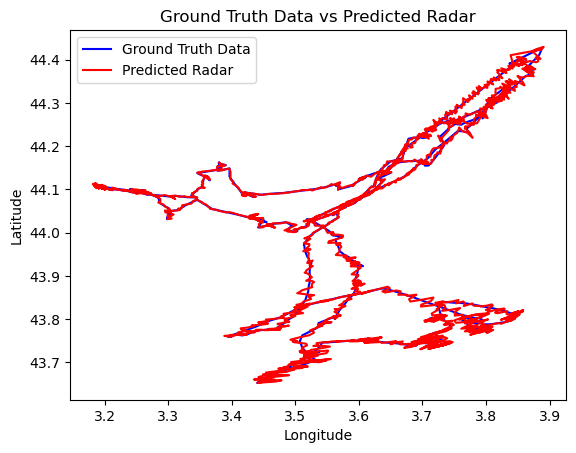

Flight G-CLPU_016


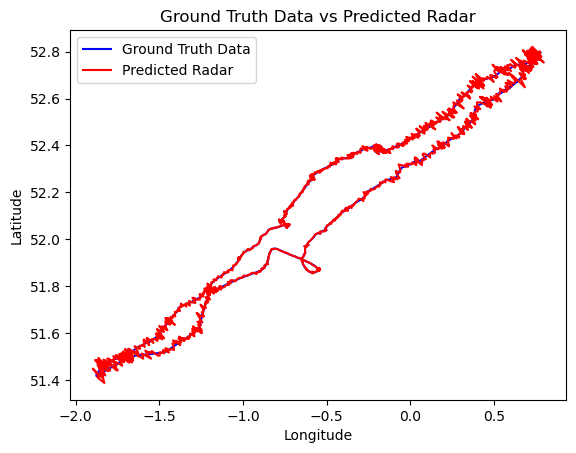

Flight D-KWFW_017


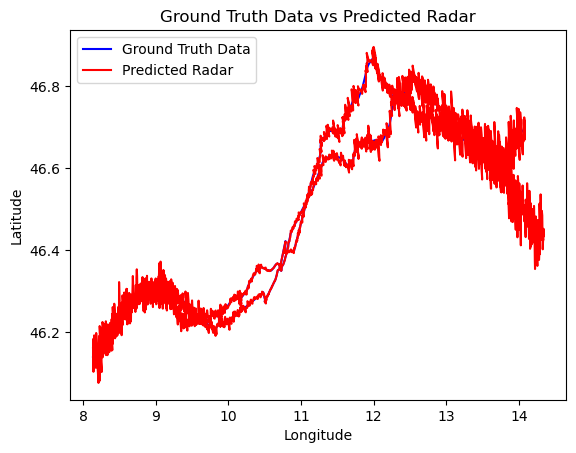

Flight REGA1_018


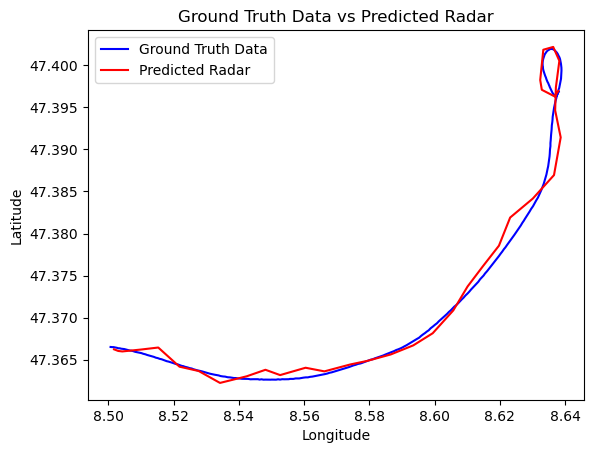

Flight SAMU31_019


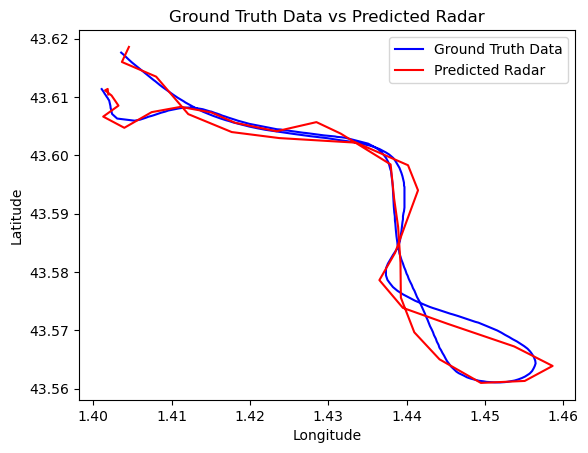

Flight REGA1_020


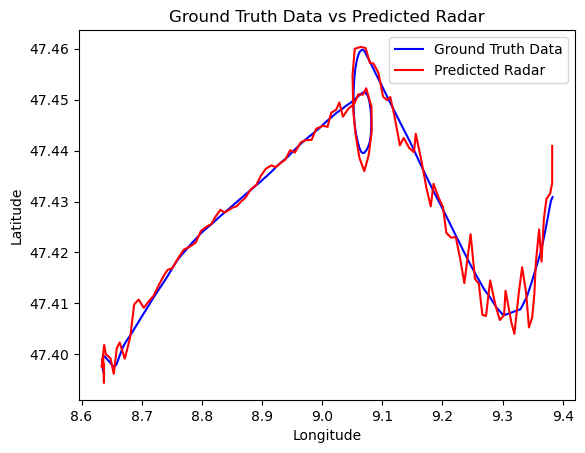

Flight CALIBRA_021


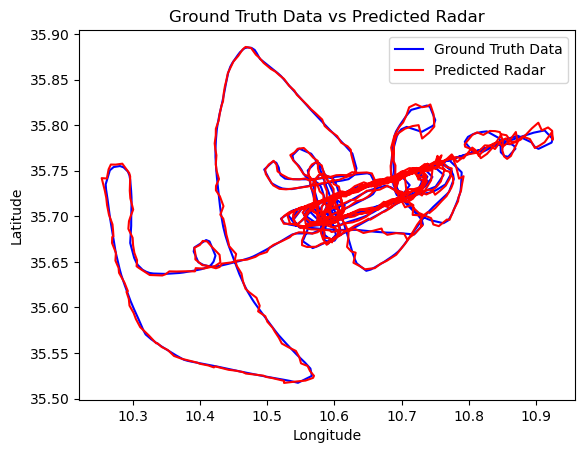

Flight YS111N_022


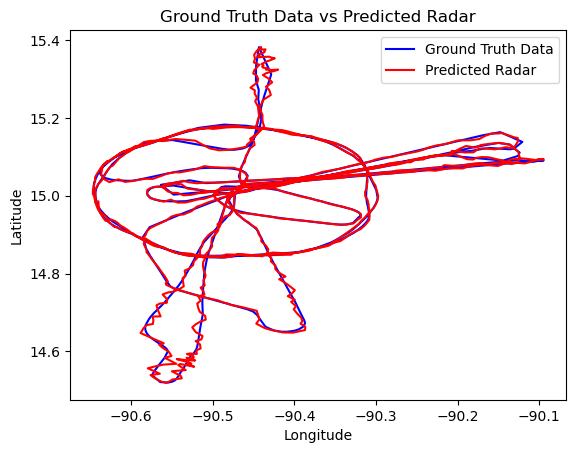

Flight VOR05_023


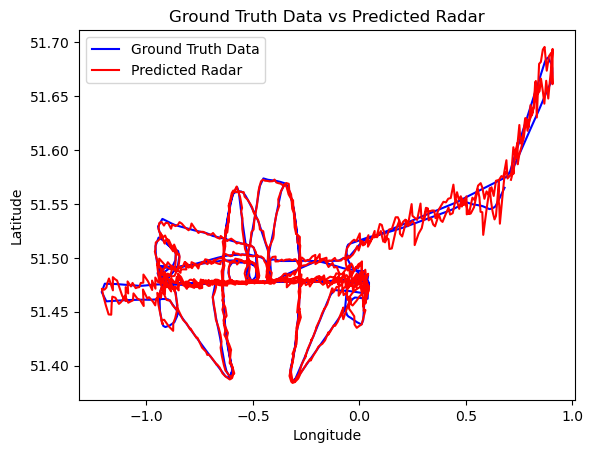

Flight GTACN_024


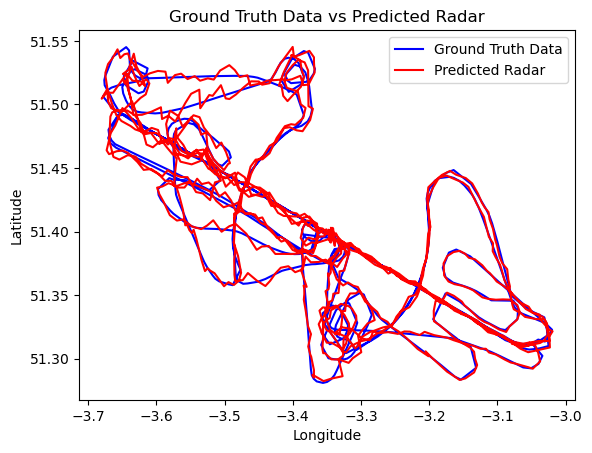

Flight ADA4_025


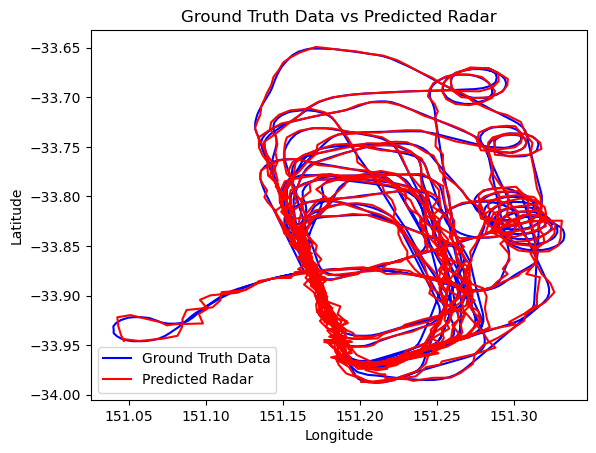

Flight CALIBRA_026


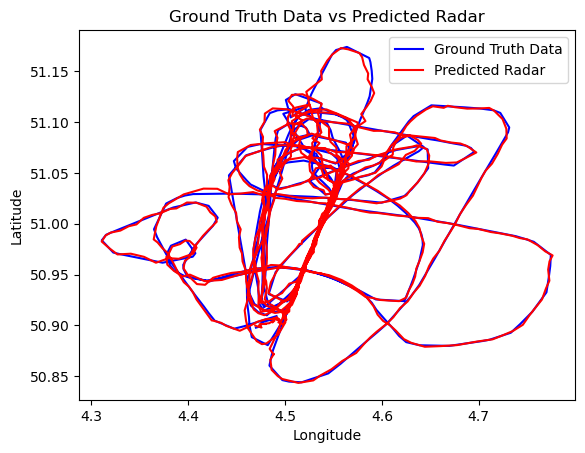

Flight CALIBRA_027


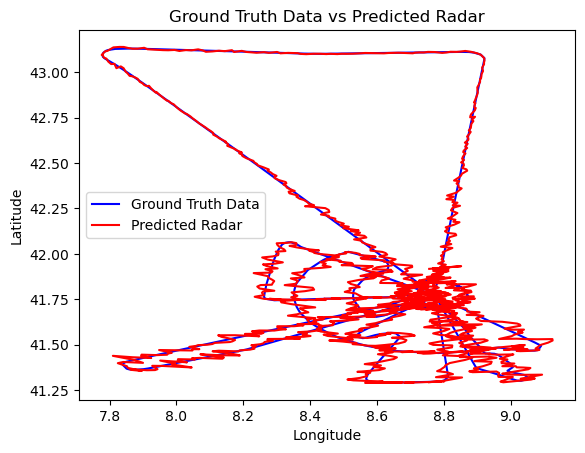

Flight CALIBRA_028


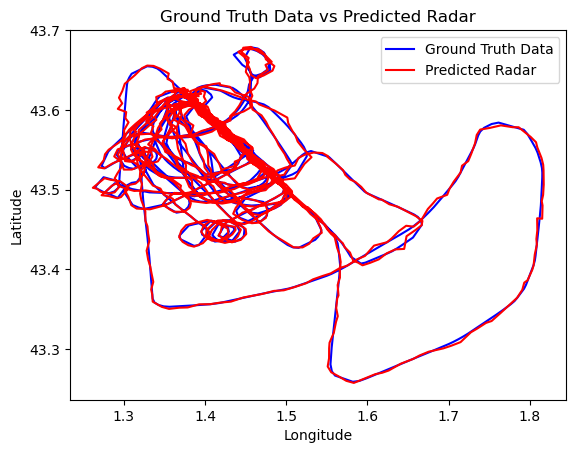

Flight CALIBRA_029


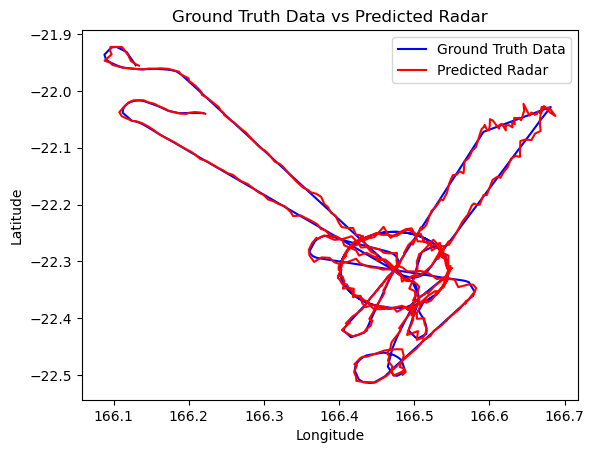

Flight GTACN_030


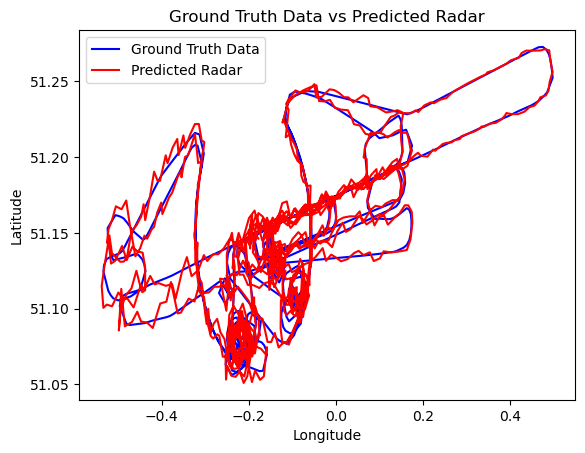

Flight ADA4_031


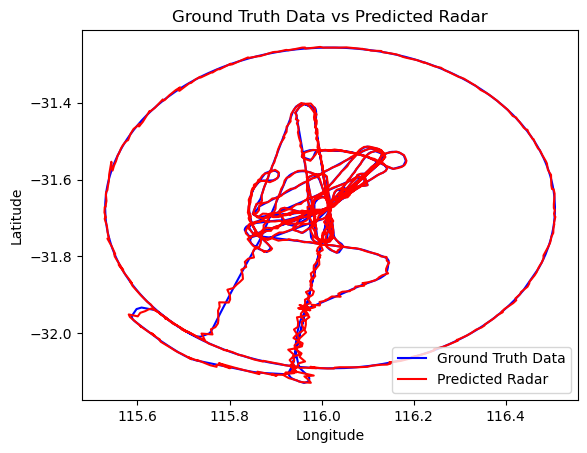

Flight 9MFCL_032


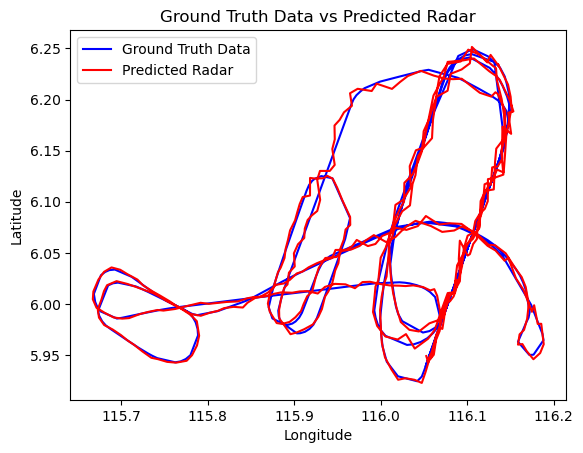

Flight NVC201_033


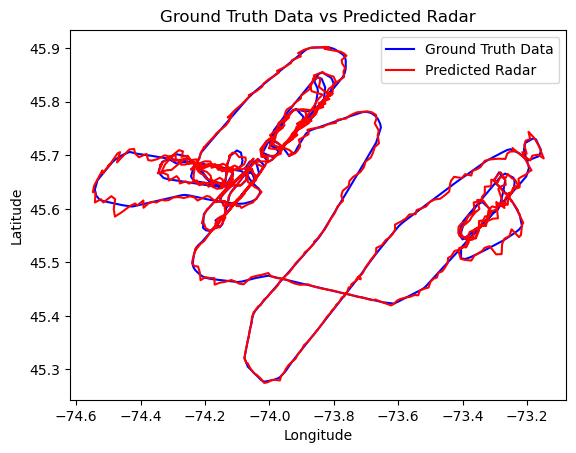

Flight VOR05_034


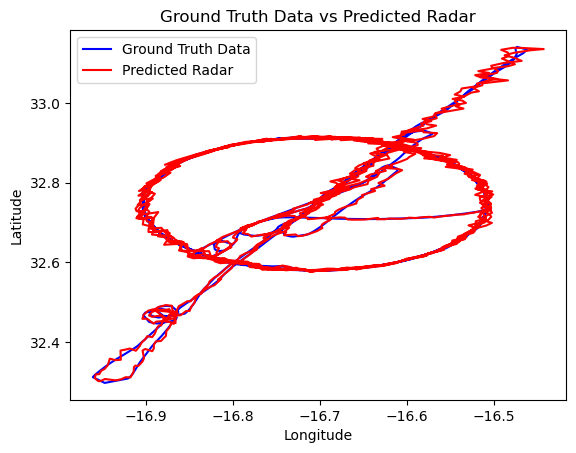

Flight CALIBRA_035


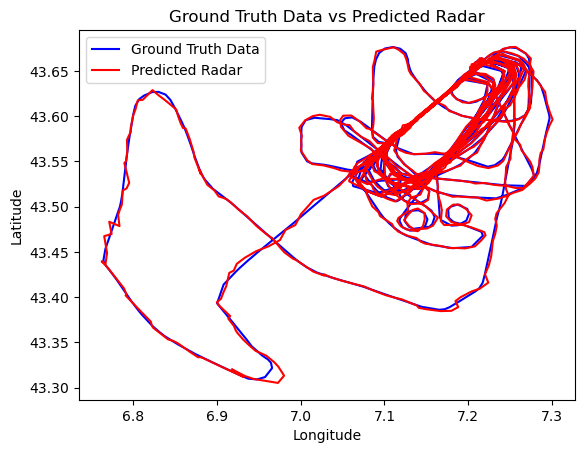

Flight FCK211_036


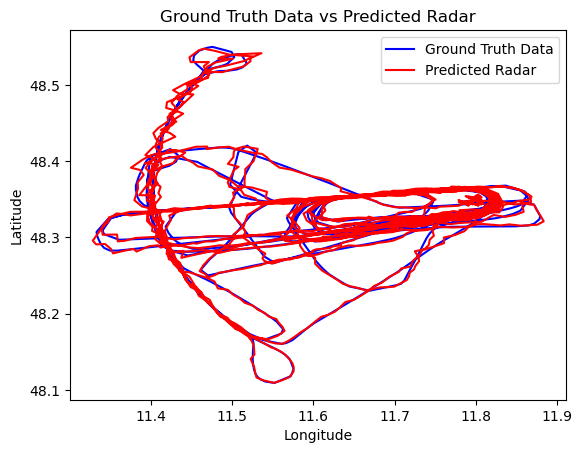

Flight NVC103_037


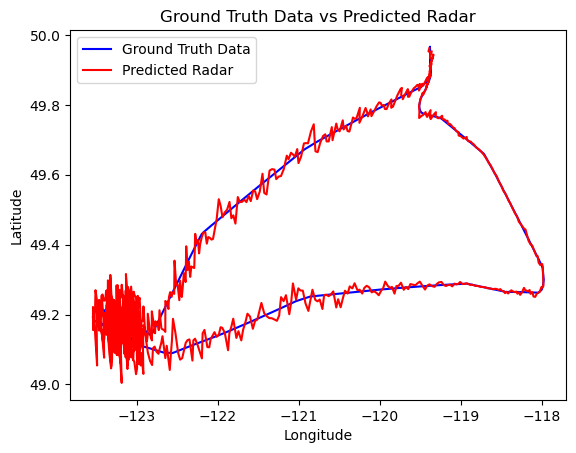

Flight VOR05_038


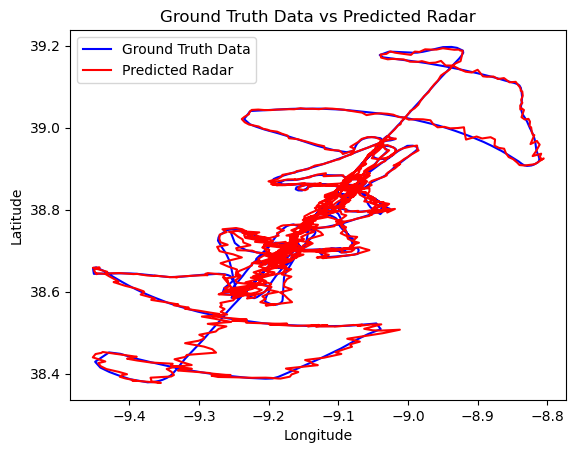

Flight CALIBRA_039


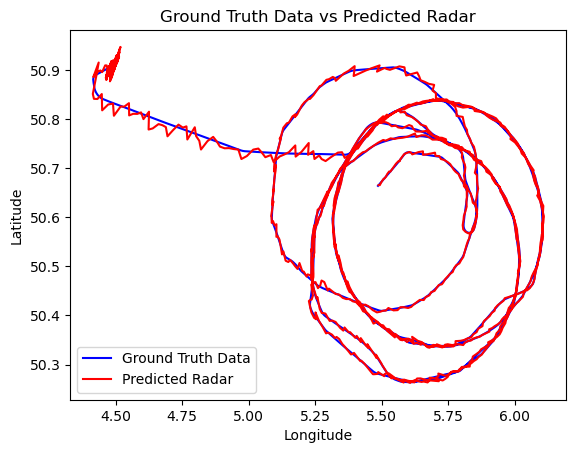

Flight CFL12_040


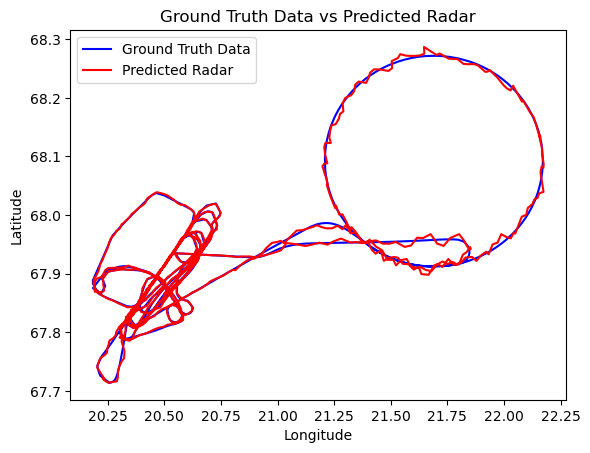

Flight CFL12_041


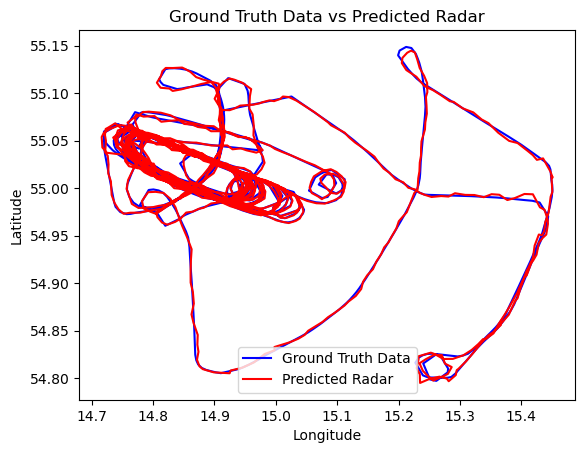

Flight YS111N_042


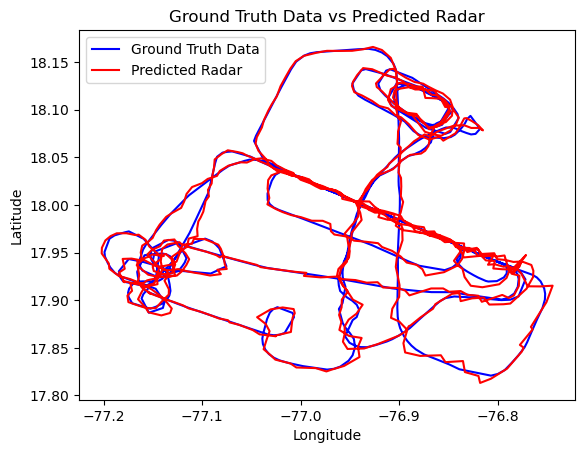

Flight CALIBRA_043


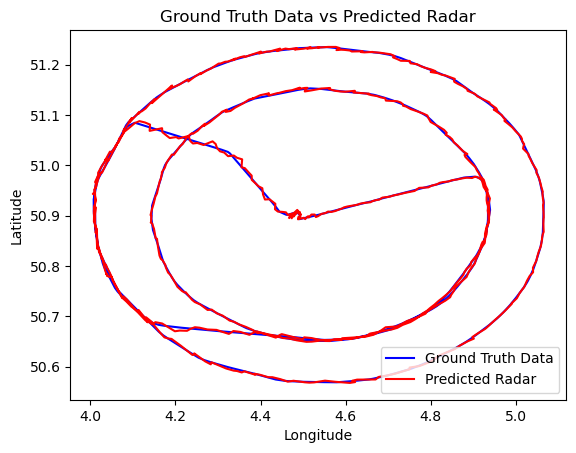

Flight FCK211_044


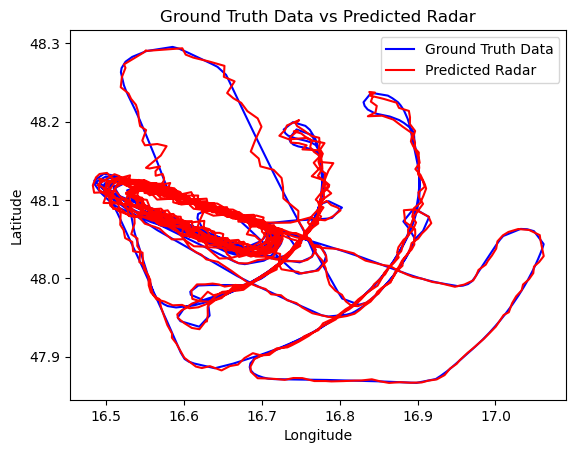

Flight GTEKV_045


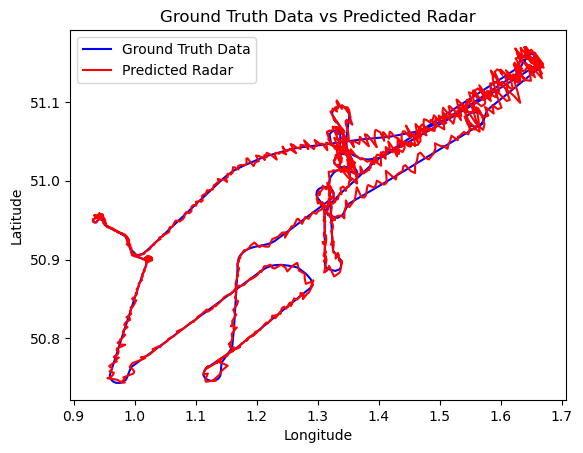

Flight BOE004_046


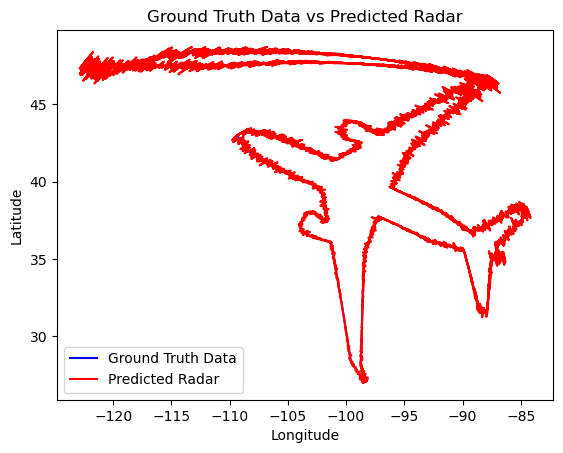

Flight N56821_047


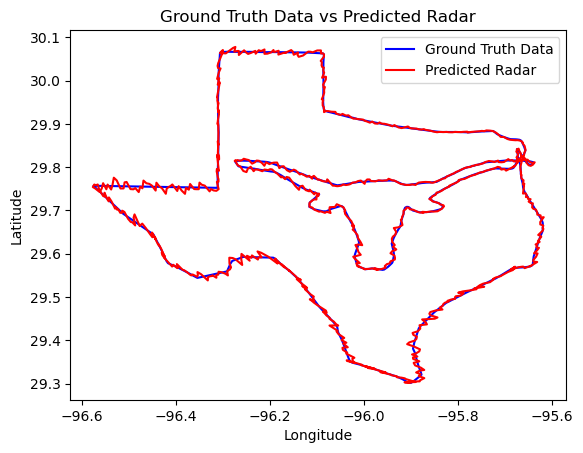

Flight ZEROG_048


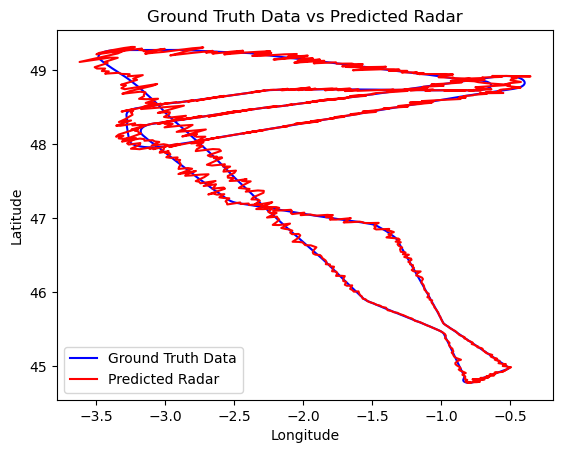

Flight QFA7474_049


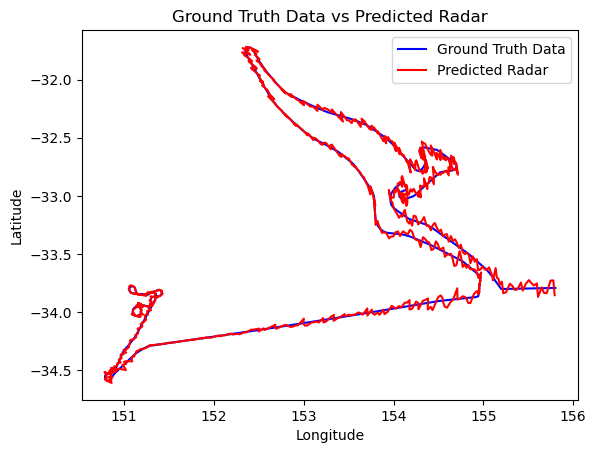

Flight THY1920_050


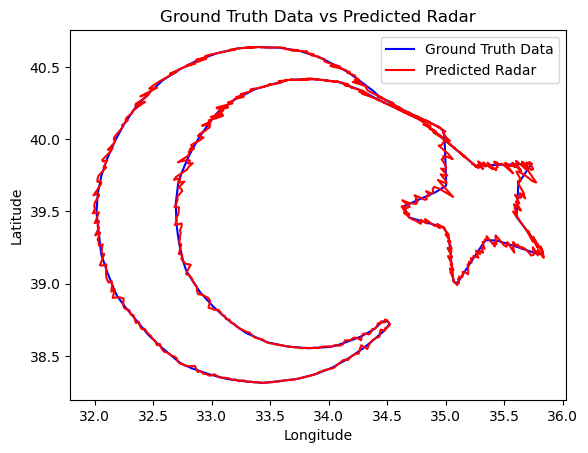

Flight AIB232E_051


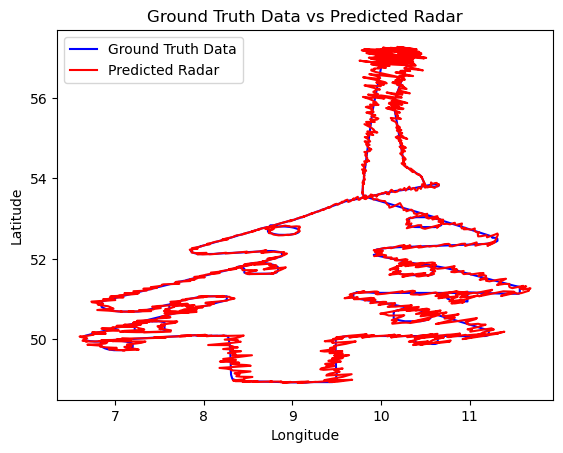

Flight DMUPY_052


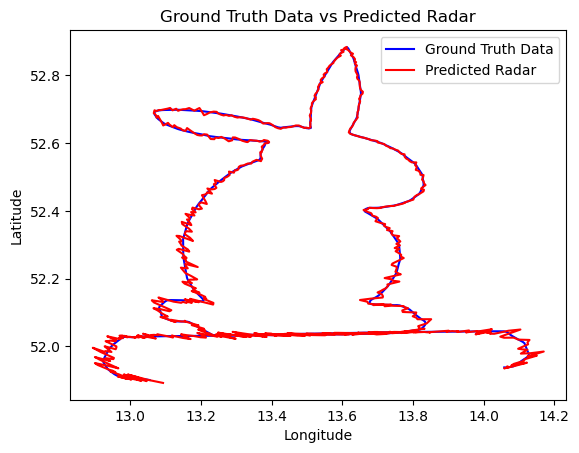

Flight TRA051_053


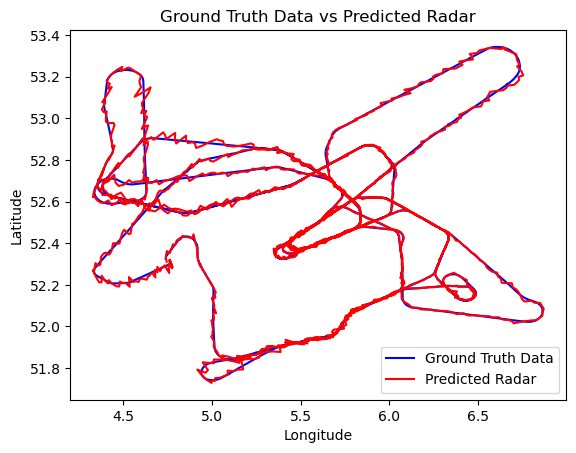

Flight VHOMS_054


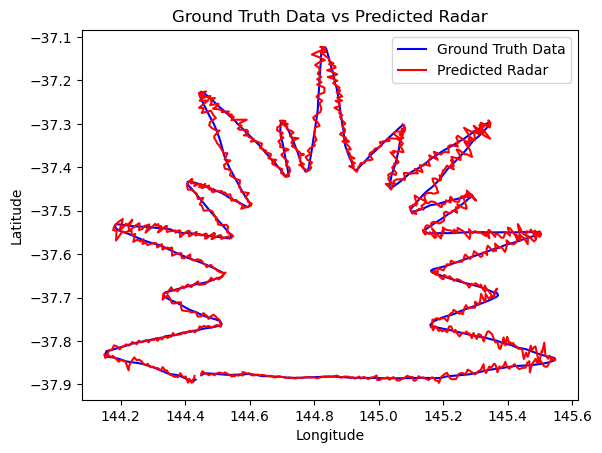

Flight HAXAE_055


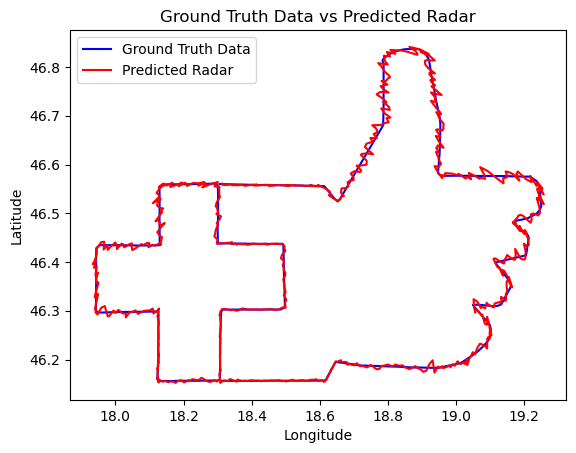

Flight OOLET_056


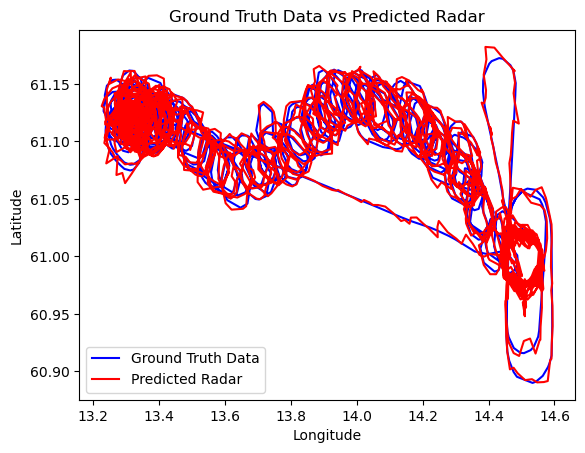

In [19]:
# Use default parameters; original Kalman filter.
for flightID, flight in allRadarData.items():
    print(f'Flight {flightID}')
    positionX = flight.data.x[0]
    positionY = flight.data.y[0]
    velocityX = 10 # We set an initial velocity of 10
    velocityY = 10 # We set an initial velocity of 10
    x = np.array([positionX, positionY, velocityX, velocityY])
    originalKalmanFilter = buildKalmanFilter(x, zDimensions, F, P, Q, R, H)
    predictionsInXY = kalmanFilterPredictUpdateProcess(originalKalmanFilter, flight)
    predictedRadarFlight = copy.deepcopy(flight)
    
    predictedRadarFlight = updateXYFromPredictions(predictedRadarFlight, predictionsInXY)
    predictedRadarFlight = set_lat_lon_from_x_y(predictedRadarFlight, projection_for_flight)
        
    plotContrastFlightLongitudeLatitude(groundTruthData[flightID], predictedRadarFlight, "Ground Truth Data", "Predicted Radar") 

# Task 6: Mean and max distance difference computation

In [20]:

def meanDistanceDifference(flightOne, flightTwo):
    flightOneLatLong = getLatLongTupleFromFlight(flightOne)
    flightTwoLatLong = getLatLongTupleFromFlight(flightTwo)
    
    sumDistance = 0
    numberOfValidDistances = 0 # We have this because sometime the distance is invalid. (data type wise).
    
    for i in range(min(len(flightOneLatLong), len(flightTwoLatLong))):
        if not any(np.isnan(flightOneLatLong[i])) and not any(np.isnan(flightTwoLatLong[i])):
            distanceDifference = geopyDistance.distance(flightOneLatLong[i], flightTwoLatLong[i]).meters
            sumDistance += distanceDifference
            numberOfValidDistances += 1
            
    if numberOfValidDistances > 0:
        return sumDistance / numberOfValidDistances
    else:
        return float('nan')


def maximalDistanceDifference(flightOne, flightTwo):
    flightOneLatLong = getLatLongTupleFromFlight(flightOne)
    flightTwoLatLong = getLatLongTupleFromFlight(flightTwo)
    
    largestDifference = 0
    
    for i in range(min(len(flightOneLatLong), len(flightTwoLatLong))):
        if not any(np.isnan(flightOneLatLong[i])) and not any(np.isnan(flightTwoLatLong[i])):
            distanceDifference = geopyDistance.distance(flightOneLatLong[i], flightTwoLatLong[i]).meters
            
            if distanceDifference >= largestDifference:
                largestDifference = distanceDifference
                
    return largestDifference


# Task 7: Property comparison across flights charts

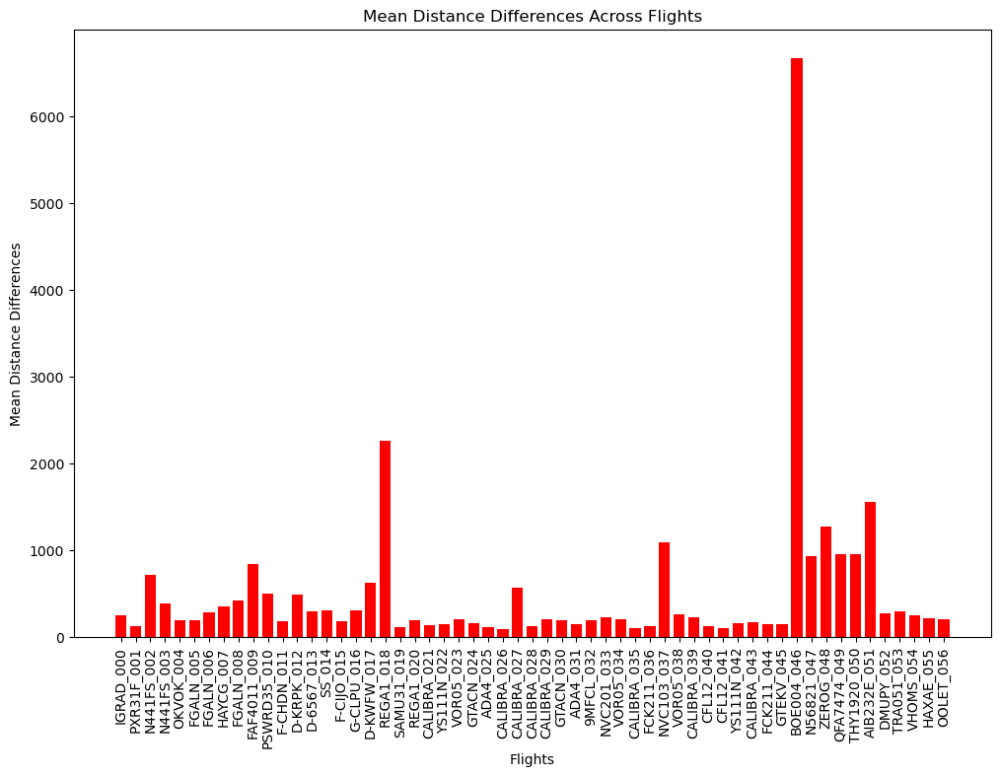

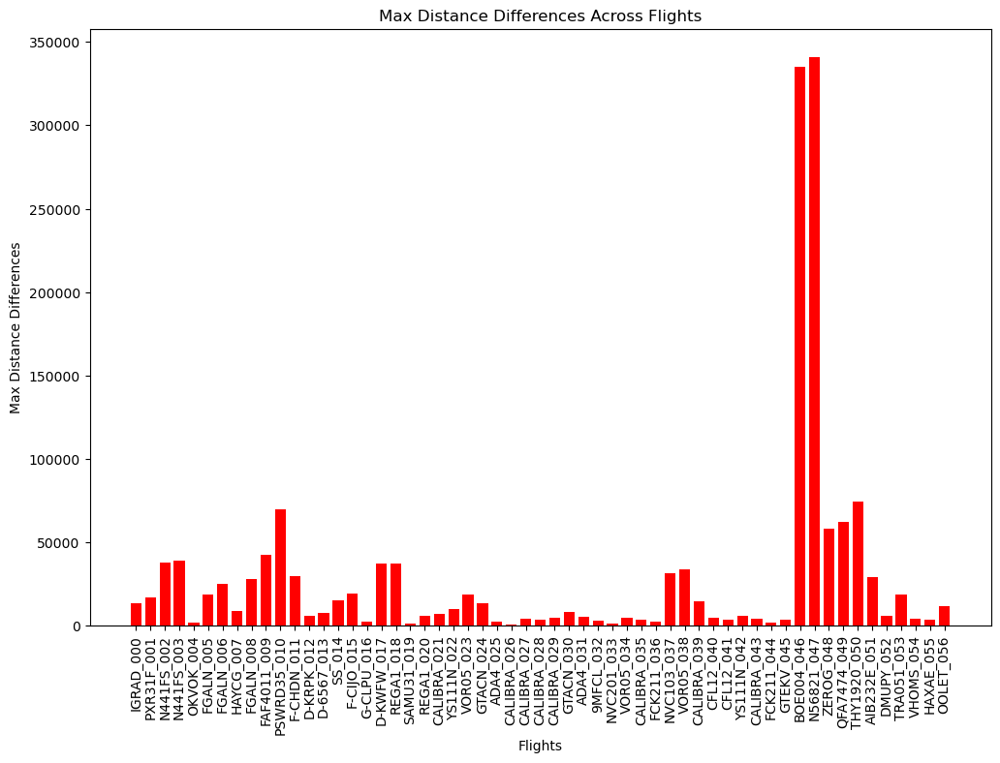

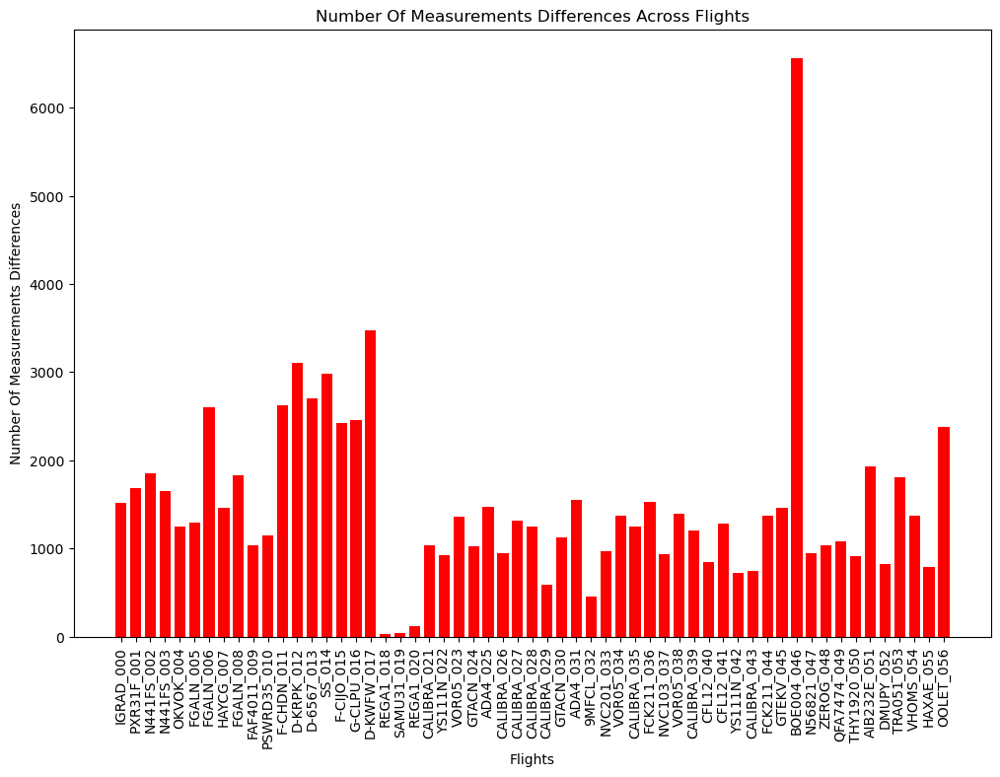

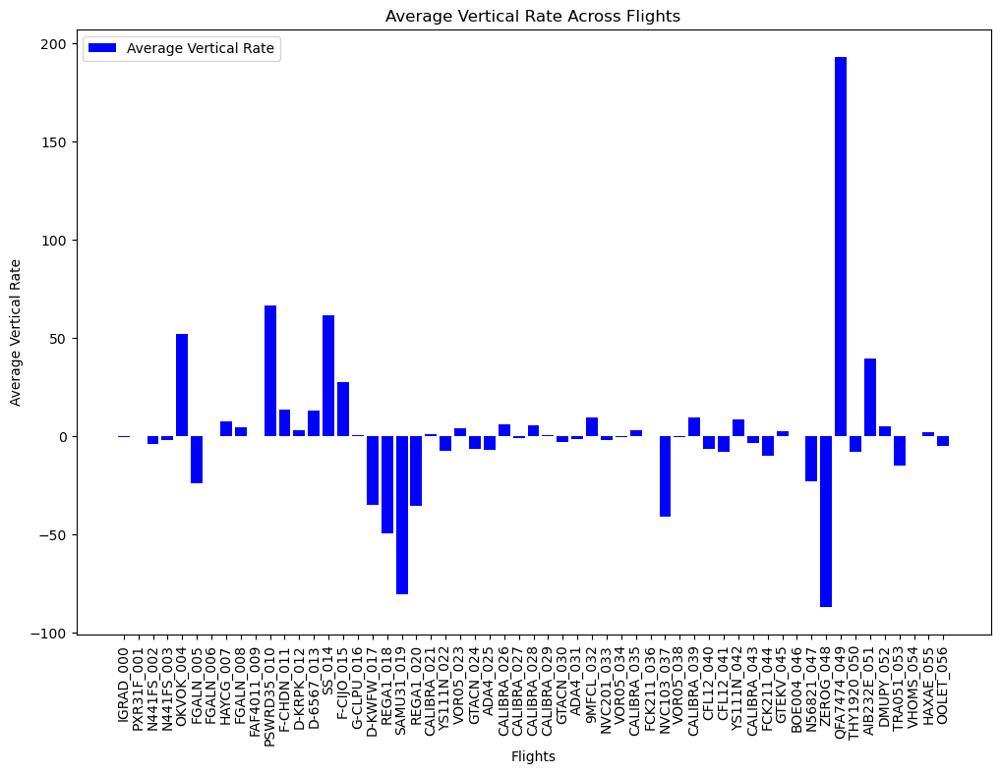

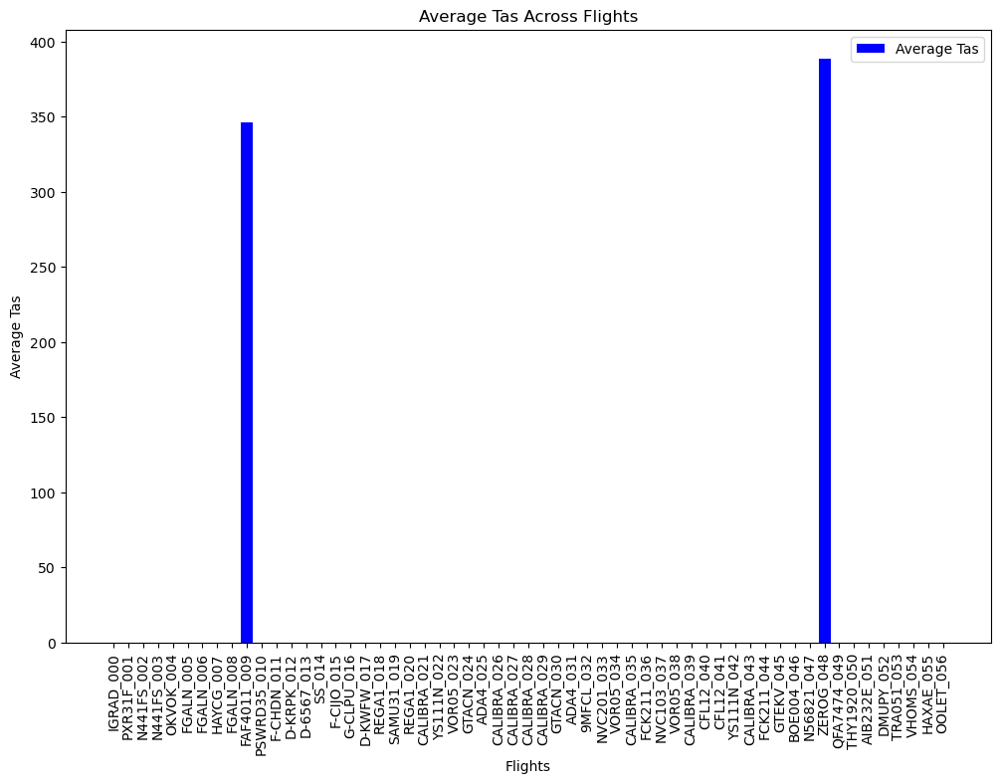

...

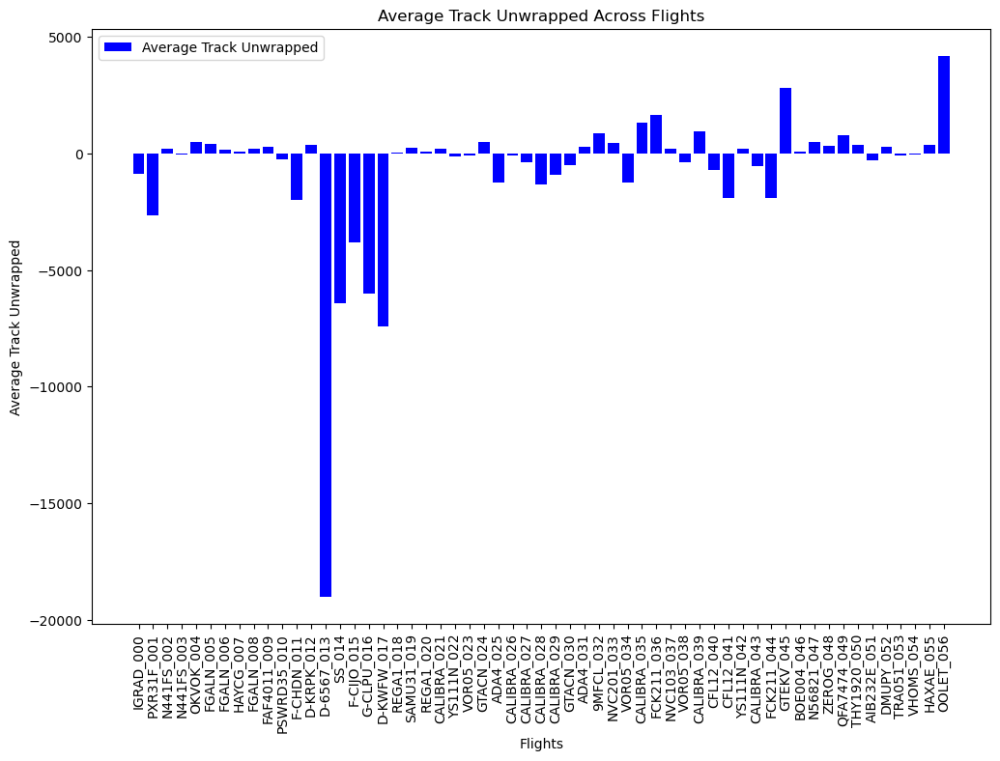

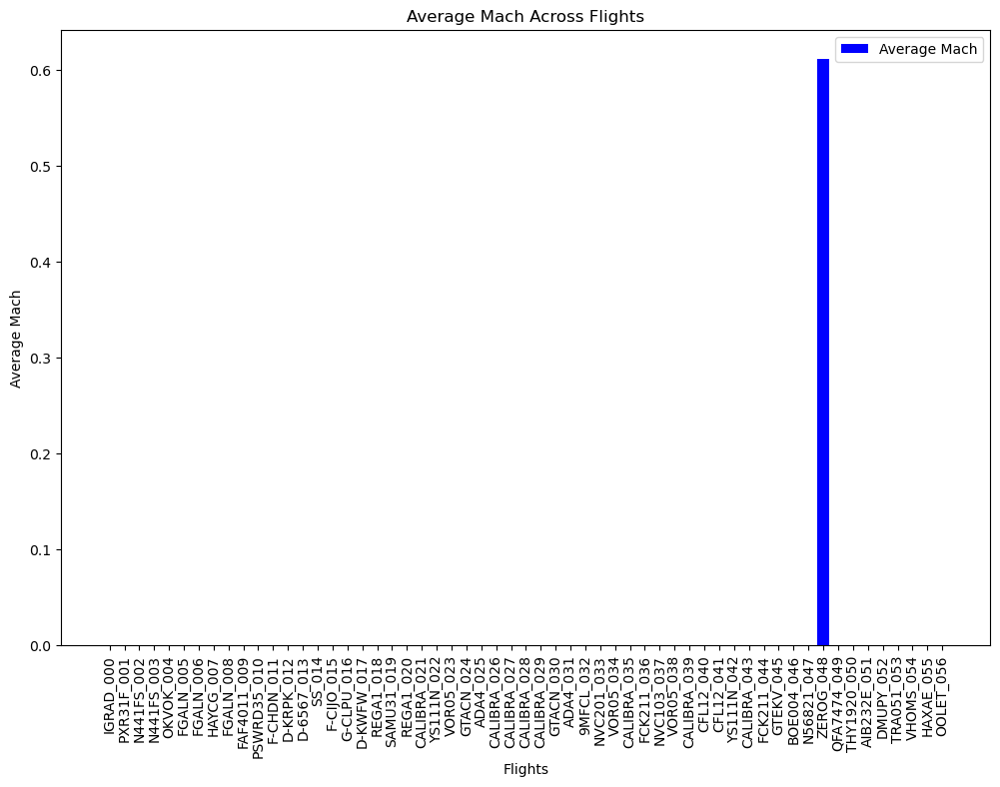

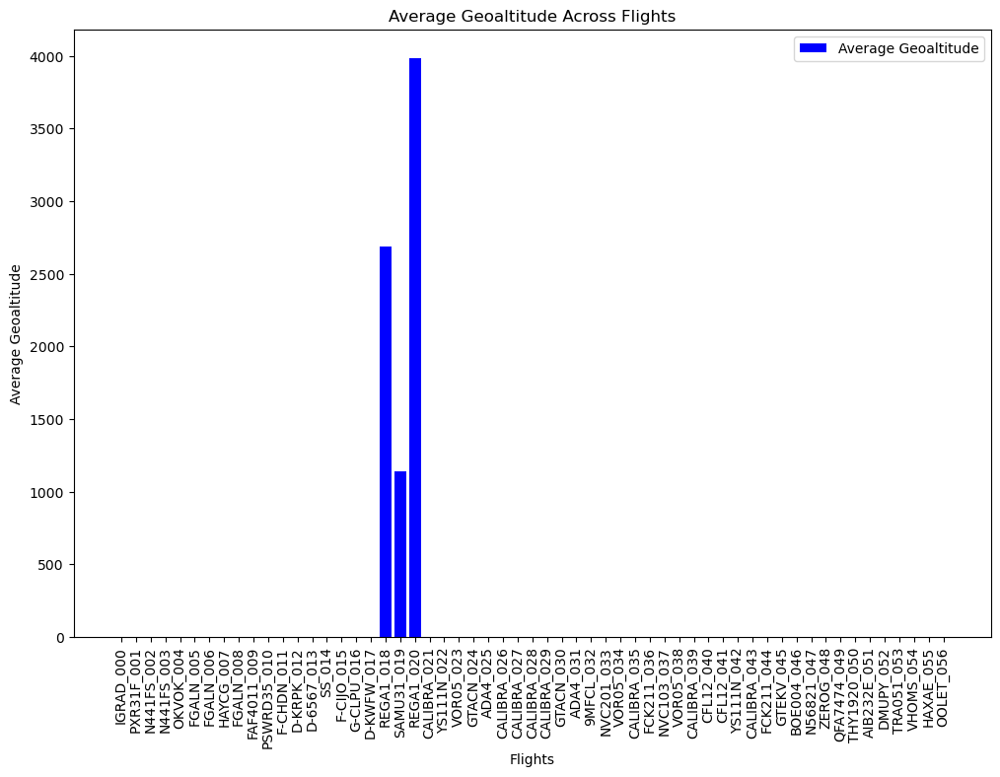

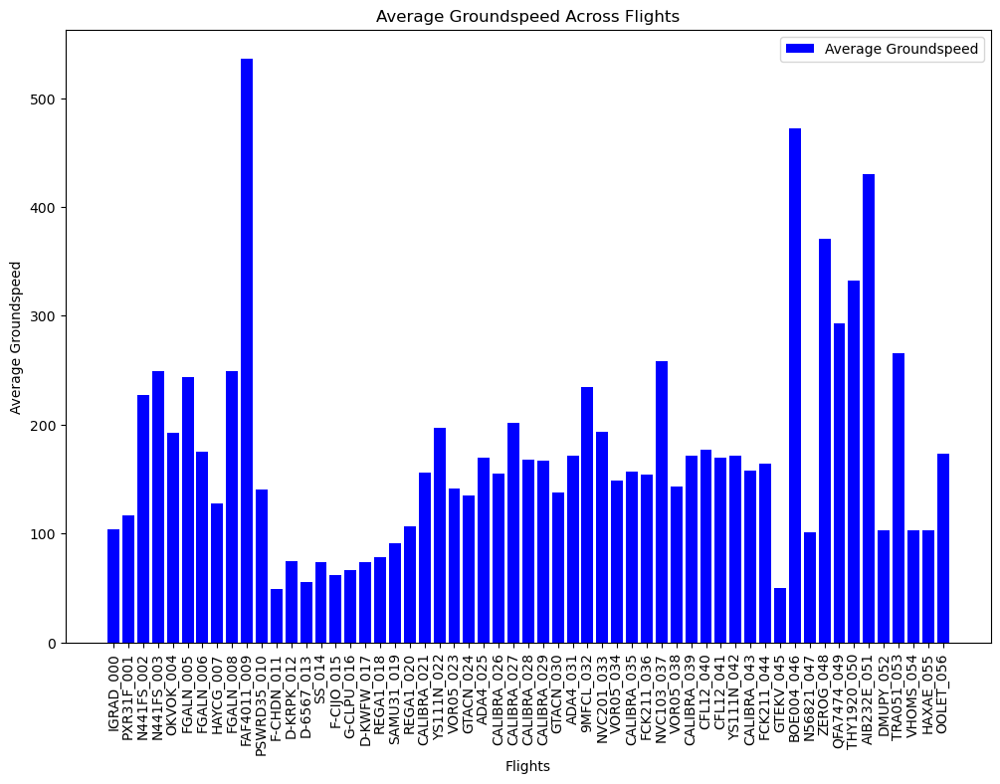

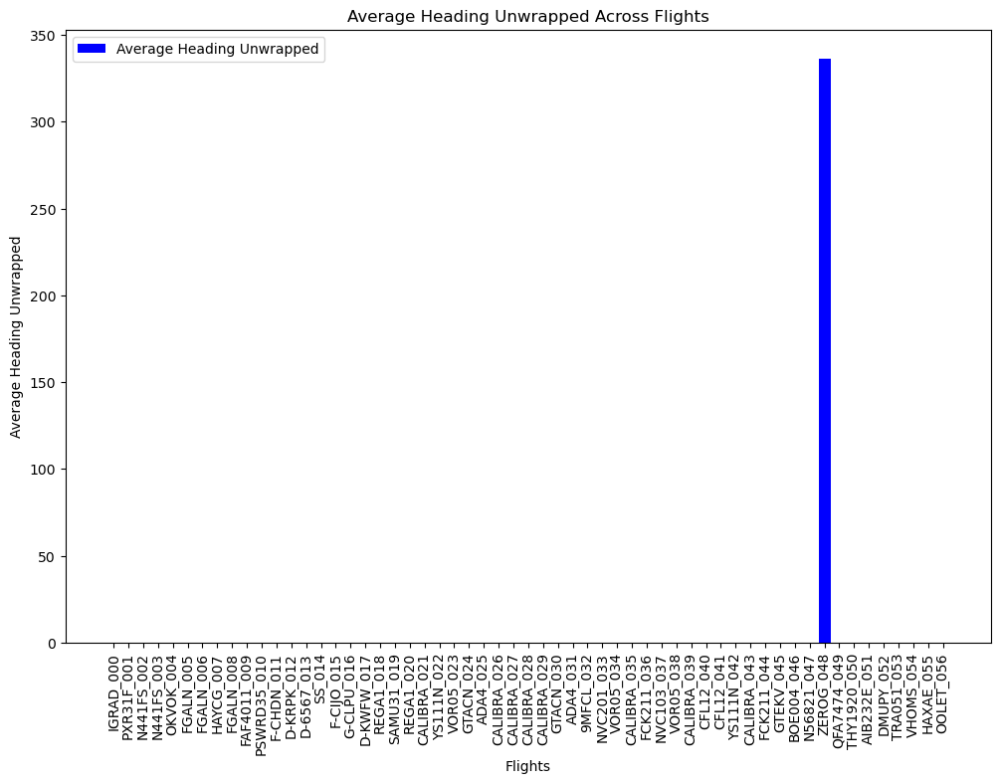

In [21]:
propertyDifferencesAcrossFlights = {'Flight ID': [], 
                                    'Mean Distance': [], 
                                    'Max Distance': [],
                                    'Number Of Measurements': []}

# Iterate through all flights and calculate property differences
for flightID, flight in allRadarData.items():
    predictionsInXY = kalmanFilterPredictUpdateProcess(originalKalmanFilter, flight)

    originalRadarFlight = copy.deepcopy(flight)
    predictedRadarFlight = copy.deepcopy(flight)
    
    predictedRadarFlight = updateXYFromPredictions(predictedRadarFlight, predictionsInXY)
    predictedRadarFlight = set_lat_lon_from_x_y(predictedRadarFlight, projection_for_flight)

    meanDistance = meanDistanceDifference(originalRadarFlight, predictedRadarFlight)
    maxDistance = maximalDistanceDifference(originalRadarFlight, predictedRadarFlight)

    propertyDifferencesAcrossFlights['Flight ID'].append(flightID)
    propertyDifferencesAcrossFlights['Mean Distance'].append(meanDistance)
    propertyDifferencesAcrossFlights['Max Distance'].append(maxDistance)
    propertyDifferencesAcrossFlights['Number Of Measurements'].append(len(flight.data))

allFlights = list(allRadarData.values())

undesiredPropertiesForPlot = ['icao24', 'origin', 'destination', 'callsign', 'latitude', 'longitude', 'flight_id', 'timestamp', 'x', 'y']

averageProperties = getAveragePropertiesAcrossFlightsForPlot(allFlights, undesiredPropertiesForPlot)
plotDifferencesAcrossFlights(propertyDifferencesAcrossFlights['Flight ID'], propertyDifferencesAcrossFlights['Mean Distance'], "Mean distance")
plotDifferencesAcrossFlights(propertyDifferencesAcrossFlights['Flight ID'], propertyDifferencesAcrossFlights['Max Distance'], "Max distance")
plotDifferencesAcrossFlights(propertyDifferencesAcrossFlights['Flight ID'], propertyDifferencesAcrossFlights['Number Of Measurements'], "Number Of Measurements")

plotAveragePropertiesAcrossFlights(propertyDifferencesAcrossFlights['Flight ID'], averageProperties)


# Task 8: Exploring different process and observation noise and computes errors

In [ ]:
# The following is just a helper to build the slider for varying measurement and process noise. 

minProcessNoiseSlider = widgets.FloatSlider(value=0.0000001, min=0.0000001, max=3, step=0.00001, description='Min Process Noise:', float_format='.10f')
maxProcessNoiseSlider = widgets.FloatSlider(value=3, min=0.0000001, max=3, step=0.00001, description='Max Process Noise:', float_format='.10f')
minMeasurementNoiseSlider = widgets.FloatSlider(value=0.0000001, min=0.0000001, max=300, step=100, description='Min Measurement Noise:', float_format='.10f')
maxMeasurementNoiseSlider = widgets.FloatSlider(value=300, min=0.0000001, max=300, step=100, description='Max Measurement Noise:', float_format='.10f')
iterationsSlider = widgets.IntSlider(value=10, min=1, max=20, step=1, description='Divisions:')
outputProcessNoiseSlider = widgets.FloatSlider(value=(minProcessNoiseSlider.value + maxProcessNoiseSlider.value) / 2,
                                               min=minProcessNoiseSlider.value,
                                               max=maxProcessNoiseSlider.value,
                                               step=(maxProcessNoiseSlider.value - minProcessNoiseSlider.value) / iterationsSlider.value,
                                               description="sigmaP", float_format='.10f')
outputMeasurementNoiseSlider = widgets.FloatSlider(value=(minMeasurementNoiseSlider.value + maxMeasurementNoiseSlider.value) / 2,
                                                    min=minMeasurementNoiseSlider.value,
                                                    max=maxMeasurementNoiseSlider.value,
                                                    step=(maxMeasurementNoiseSlider.value - minMeasurementNoiseSlider.value) / iterationsSlider.value,
                                                    description="sigmaO", float_format='.10f')
output = widgets.Output()

def handleSliderChange(change):
    with output:
        output.clear_output()
        if change['name'] == 'value':
            
            if change['owner'] == minProcessNoiseSlider:
                if change.new > maxProcessNoiseSlider.value:
                    minProcessNoiseSlider.value = maxProcessNoiseSlider.value
                else:
                    print(f"New Min Process Noise value: {change.new:.10f}")
            elif change['owner'] == maxProcessNoiseSlider:
                if change.new < minProcessNoiseSlider.value:
                    maxProcessNoiseSlider.value = minProcessNoiseSlider.value
                else:
                    print(f"New Max Process Noise value: {change.new:.10f}")
                    
            elif change['owner'] == minMeasurementNoiseSlider:
                if change.new > maxMeasurementNoiseSlider.value:
                    minMeasurementNoiseSlider.value = maxMeasurementNoiseSlider.value
                else:
                    print(f"New Min Measurement Noise value: {change.new:.10f}")
            elif change['owner'] == maxMeasurementNoiseSlider:
                if change.new < minMeasurementNoiseSlider.value:
                    maxMeasurementNoiseSlider.value = minMeasurementNoiseSlider.value
                else:
                    print(f"New Max Measurement Noise value: {change.new:.10f}")
            elif change['owner'] == iterationsSlider:
                print(f"New Iterations value: {change.new}")
                
            outputProcessNoiseSlider.min = minProcessNoiseSlider.value
            outputProcessNoiseSlider.max = maxProcessNoiseSlider.value
            outputProcessNoiseSlider.step = (maxProcessNoiseSlider.value - minProcessNoiseSlider.value) / iterationsSlider.value
        
            outputMeasurementNoiseSlider.min = minMeasurementNoiseSlider.value
            outputMeasurementNoiseSlider.max = maxMeasurementNoiseSlider.value
            outputMeasurementNoiseSlider.step = (maxMeasurementNoiseSlider.value - minMeasurementNoiseSlider.value) / iterationsSlider.value

                
            print(f"Updated Iterations: {iterationsSlider.value}")

minProcessNoiseSlider.observe(handleSliderChange, 'value')
maxProcessNoiseSlider.observe(handleSliderChange, 'value')
minMeasurementNoiseSlider.observe(handleSliderChange, 'value')
maxMeasurementNoiseSlider.observe(handleSliderChange, 'value')
iterationsSlider.observe(handleSliderChange, 'value')
outputProcessNoiseSlider.observe(handleSliderChange, 'value')
outputMeasurementNoiseSlider.observe(handleSliderChange, 'value')

widgets.VBox([minProcessNoiseSlider, maxProcessNoiseSlider, minMeasurementNoiseSlider, maxMeasurementNoiseSlider,
              iterationsSlider, output])


In [ ]:
'''
This slider enables visualisation of possibly any combination of values.
And you can tweak the min, max, step parameters from the code block above.
The idea of this code is that it allows you to dynamically choose the intervals to perform comparison across all flights.

Example:
(minProcessNoise,maxProcessNoise) = (0, 3)
(minObservationNoise,maxObservationNoise) = (0, 300)
And we set divisions to 5.
So that means we will have 5 different sigma values for both process and observation noise:
Process noise sigma values: [0, 0.6, 1.2, 1.8, 2.4, 3.0]
Observation noise sigma values: [0, 60, 120, 180, 240, 300]

The above is autocomputed; all the user has to do is just move the divisions slider 
to determine the number of values desired.

Then, the following functions will select random number of flights first.

Next, when you update the slider values: rebuildKalmanFilterAndComputeErrors runs.
This function contains the logic to build the kalman filter with each sigma value in the list.
Then, it will compute the mean distance and max distance errors.
It will do save all the results, for all the flights, each.

The final output of the operation is in a variable called flightErrorsOfVaryingSigmas.
This will be passed on to the next function to be parsed and analysed; to determine the best
set of sigma values.

This function that parses and analyses is findBestSigma. This uses a helper findMinimumDistanceSigmas.

The output of findBestSigma is the tuple: 

processBestSigmaMean, processBestSigmaMax, observationBestSigmaMean, observationBestSigmaMax

of which each minimises the respective distances across all the flights the most.

'''
flightErrorsOfVaryingSigmas = None
numberOfFlightsToAnalyse = 10

def selectRandomFlights(numberOfFlightsToAnalyse, allFlights):
    if numberOfFlightsToAnalyse >= len(allFlights):
        return allFlights
        
    randomFlights = random.sample(allFlights, numberOfFlightsToAnalyse)
    return randomFlights

randomFlightsChosenForSimulation = selectRandomFlights(numberOfFlightsToAnalyse, allRadarData.keys())
print("Selected random flights for simulation:")
for flight in randomFlightsChosenForSimulation:
    print(flight)

def updateOutputSliderValues(change):
    global outputProcessNoiseSlider, outputMeasurementNoiseSlider
    
    with output:
        output.clear_output()
        if change['name'] == 'value':
            if change['owner'] == outputProcessNoiseSlider:
                outputProcessNoiseSlider.value = change.new
            if change['owner'] == outputMeasurementNoiseSlider:
                outputMeasurementNoiseSlider.value = change.new

        sigmaO = outputMeasurementNoiseSlider.value
        sigmaP = outputProcessNoiseSlider.value
        print("Beginning computation of errors...")
        rebuildKalmanFilterAndComputeErrors(sigmaO, sigmaP)

def rebuildKalmanFilterAndComputeErrors(sigmaO, sigmaP):
    flightErrors = {}
    
    for flightID in randomFlightsChosenForSimulation:
        print(f"Program is running! Processing flight {flightID}:")
        flightErrors[flightID] = {}
        processNoiseErrors = {}
        observationNoiseErrors = {}

        
        positionX = allRadarData[flightID].data.x[0]
        positionY = allRadarData[flightID].data.y[0]
        velocityX = 10 # We set an initial velocity of 10
        velocityY = 10 # We set an initial velocity of 10
        x = np.array([positionX, positionY, velocityX, velocityY])
        for count in range(iterationsSlider.value+1):
            for count2 in range(iterationsSlider.value+1):
                print("Simulating parameters:")
                processNoiseSigma = outputProcessNoiseSlider.min + count*outputProcessNoiseSlider.step
                print(f"Process Noise: {processNoiseSigma} m")
                
                R = buildR(sigmaO)
                Q = buildQ(processNoiseSigma)
    
                kf = buildKalmanFilter(x, zDimensions, F, P, Q, R, H)
                
                predictionsInXY = kalmanFilterPredictUpdateProcess(kf, allRadarData[flightID])
                predictedRadarFlight = copy.deepcopy(allRadarData[flightID])
                
                predictedRadarFlight = updateXYFromPredictions(predictedRadarFlight, predictionsInXY)
                predictedRadarFlight = set_lat_lon_from_x_y(predictedRadarFlight, projection_for_flight)
    
    
                #plotContrastFlightLongitudeLatitude(groundTruthData[flightID], predictedRadarFlight, "Ground Truth Data", "Predicted Radar") 
                meanDistance = meanDistanceDifference(groundTruthData[flightID], predictedRadarFlight)
                maxDistance = maximalDistanceDifference(groundTruthData[flightID], predictedRadarFlight)
                
                processNoiseErrors[processNoiseSigma] = [meanDistance, maxDistance]

        
                observationNoiseSigma = outputMeasurementNoiseSlider.min + count2*outputMeasurementNoiseSlider.step           
                print(f"Observation Noise: {observationNoiseSigma} m/s^2")
                
                R = buildR(observationNoiseSigma)
                Q = buildQ(sigmaP)
                kf = buildKalmanFilter(x, zDimensions, F, P, Q, R, H)
                
                predictionsInXY = kalmanFilterPredictUpdateProcess(kf, allRadarData[flightID])
                predictedRadarFlight = copy.deepcopy(allRadarData[flightID])
                
                predictedRadarFlight = updateXYFromPredictions(predictedRadarFlight, predictionsInXY)
                predictedRadarFlight = set_lat_lon_from_x_y(predictedRadarFlight, projection_for_flight)
    
    
                #plotContrastFlightLongitudeLatitude(groundTruthData[flightID], predictedRadarFlight, "Ground Truth Data", "Predicted Radar") 
                meanDistance = meanDistanceDifference(groundTruthData[flightID], predictedRadarFlight)
                maxDistance = maximalDistanceDifference(groundTruthData[flightID], predictedRadarFlight)
                
                observationNoiseErrors[observationNoiseSigma] = [meanDistance, maxDistance]
                print()
            
        flightErrors[flightID] = {'processNoiseErrors': processNoiseErrors, 'observationNoiseErrors': observationNoiseErrors}
        print("\n\n\n")

    global flightErrorsOfVaryingSigmas 
    flightErrorsOfVaryingSigmas = flightErrors
    print("Program completed. Setting flightErrorsOfVaryingSigmas..")
outputProcessNoiseSlider.observe(updateOutputSliderValues, 'value')
outputMeasurementNoiseSlider.observe(updateOutputSliderValues, 'value')
iterationsSlider.observe(updateOutputSliderValues, 'value')
widgets.VBox([outputProcessNoiseSlider, outputMeasurementNoiseSlider, output])

In [ ]:
def flightErrorsOfVaryingSigmaFormatter(flightErrorsOfVaryingSigmas):
    # Prints nicely for interpretation / This is for generating the charts for a report for varying sigma.
    print("Parameters:")
    print("Selected Random Flights:")
    for number, flight in enumerate(flightErrorsOfVaryingSigmas):
        print(f"{number+1}. {flight}")
    print()

    for errorType in ["processNoiseErrors", "observationNoiseErrors"]:
        print(f"Standard Deviation Values used for {errorType}:")
        sigmaValues = list(flightErrorsOfVaryingSigmas[flight][errorType].keys())
        for number, sigmaValues in enumerate(sigmaValues):
            print(f"{number+1}. {sigmaValues}")
        print()

    
    for flight in flightErrorsOfVaryingSigmas:
        print("Flight", flight, "| Sum Of Errors")
        for errorType in flightErrorsOfVaryingSigmas[flight]:
            print()
            if errorType == "processNoiseErrors":
                print("Error type: Process Noise Errors")
            else:
                print("Error type: Observation Noise Errors")
            for number, sigmaValue in enumerate(flightErrorsOfVaryingSigmas[flight][errorType]):
                print(str(number+1) + ". Sigma value:",sigmaValue)
                print("Mean distance:", flightErrorsOfVaryingSigmas[flight][errorType][sigmaValue][0])
                print("Max distance:", flightErrorsOfVaryingSigmas[flight][errorType][sigmaValue][1])
                print()
        print()
flightErrorsOfVaryingSigmaFormatter(flightErrorsOfVaryingSigmas)

def findMinimumDistanceSigmas(processOrObservationNoiseError):
    minMeanDistanceSum = float('inf')
    minMaxDistanceSum = float('inf')
    minMeanDistanceKey = None
    minMaxDistanceKey = None
    
    for sigmaValue, distances in processOrObservationNoiseError.items():
        meanDistanceSum = distances['meanDistanceSum']
        maxDistanceSum = distances['maxDistanceSum']

        # We do not actually have to divide or find the average. The sum of errors
        # across all the flights for that particular value of sigma provides us
        # with enough information to compare with other values of this sigma.
        if meanDistanceSum < minMeanDistanceSum:
            minMeanDistanceSum = meanDistanceSum
            minMeanDistanceKey = sigmaValue
        
        if maxDistanceSum < minMaxDistanceSum:
            minMaxDistanceSum = maxDistanceSum
            minMaxDistanceKey = sigmaValue
    
    return minMeanDistanceKey, minMaxDistanceKey


def findBestSigma(flightErrorsOfVaryingSigmas):
    bestObservationSigma = None
    bestProcessSigma = None
    minMeanDistance = float('inf')
    minMaxDistance = float('inf')
    totalFlights = len(flightErrorsOfVaryingSigmas)

    sumProcessMeanDistance = 0
    sumProcessMaxDistance = 0
    sumObservationMeanDistance = 0
    sumObservationMaxDistance = 0
    
    numberOfSigmaValues = 0
    
    # Count the number of sigma values for process and observation noises
    for flight in flightErrorsOfVaryingSigmas:
        for errorType in flightErrorsOfVaryingSigmas[flight]:
            numberOfSigmaValues = len(flightErrorsOfVaryingSigmas[flight][errorType])

    processNoiseError = {}
    observationNoiseError = {}
    
    for flight in flightErrorsOfVaryingSigmas:
        for errorType in flightErrorsOfVaryingSigmas[flight]:
            if errorType == 'processNoiseErrors':
                for sigmaValue in flightErrorsOfVaryingSigmas[flight][errorType]:
                    if sigmaValue not in processNoiseError:
                        processNoiseError[sigmaValue] = {"meanDistanceSum": 0, "maxDistanceSum": 0}
                    processNoiseError[sigmaValue]['meanDistanceSum'] += flightErrorsOfVaryingSigmas[flight][errorType][sigmaValue][0]
                    processNoiseError[sigmaValue]['maxDistanceSum'] += flightErrorsOfVaryingSigmas[flight][errorType][sigmaValue][1]
            elif errorType == 'observationNoiseErrors':
                
                for sigmaValue in flightErrorsOfVaryingSigmas[flight][errorType]:
                    if sigmaValue not in observationNoiseError:
                        observationNoiseError[sigmaValue] = {"meanDistanceSum": 0, "maxDistanceSum": 0}
                    
                    observationNoiseError[sigmaValue]['meanDistanceSum'] += flightErrorsOfVaryingSigmas[flight][errorType][sigmaValue][0]
                    observationNoiseError[sigmaValue]['maxDistanceSum'] += flightErrorsOfVaryingSigmas[flight][errorType][sigmaValue][1]

    processBestSigmaMean, processBestSigmaMax = findMinimumDistanceSigmas(processNoiseError)
    print("Process noise: best parameters are:")
    print("(mean distance, max distance):", (processBestSigmaMean, processBestSigmaMax))
    
    observationBestSigmaMean, observationBestSigmaMax = findMinimumDistanceSigmas(observationNoiseError)
    print("\nObservation noise: best parameters are:")
    print("(mean distance, max distance):", (observationBestSigmaMean, observationBestSigmaMax))
    
    return (processBestSigmaMean, processBestSigmaMax, observationBestSigmaMean, observationBestSigmaMax)

processBestSigmaMean, processBestSigmaMax, observationBestSigmaMean, observationBestSigmaMax = findBestSigma(flightErrorsOfVaryingSigmas)
    

# Task 9: Smoothing

Flight IGRAD_000


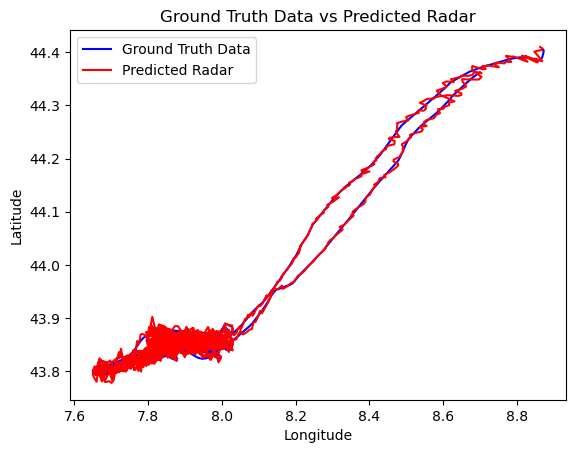

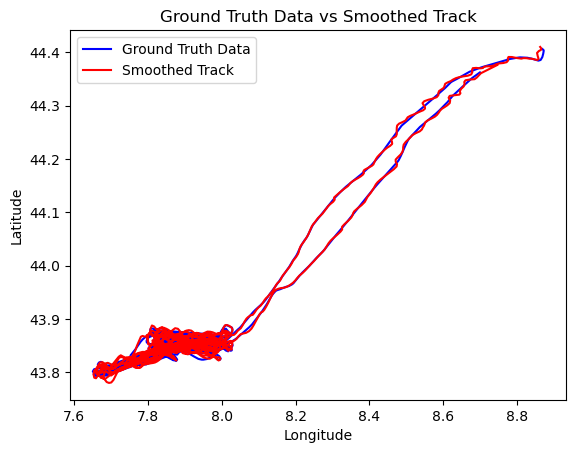

Flight PXR31F_001


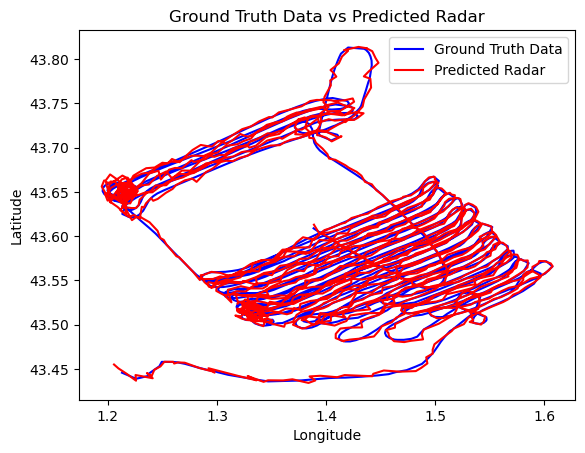

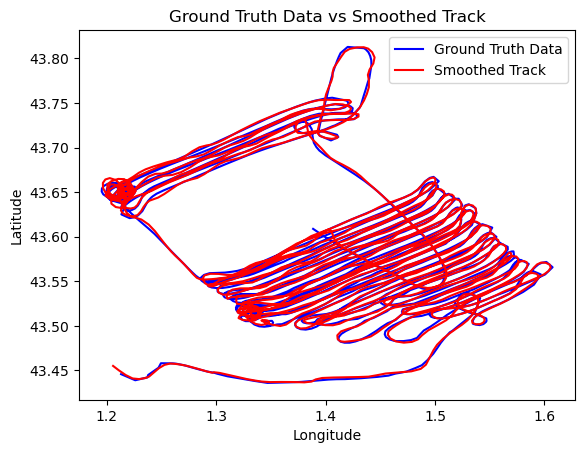

Flight N441FS_002


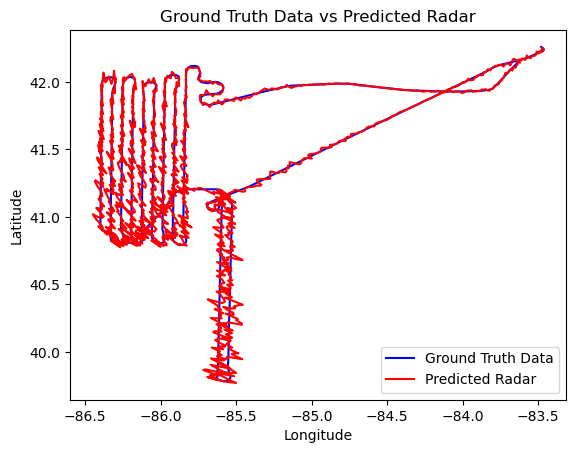

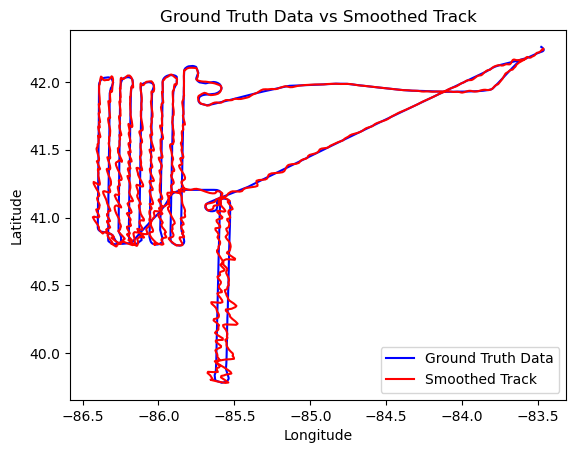

Flight N441FS_003


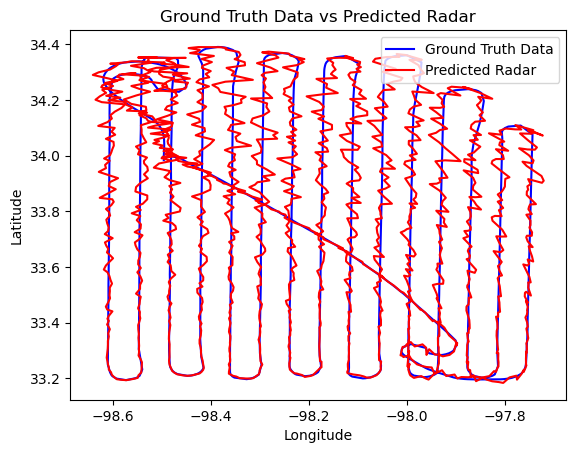

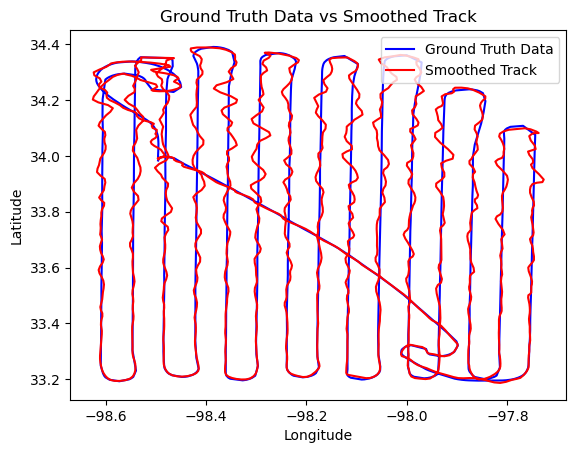

Flight OKVOK_004


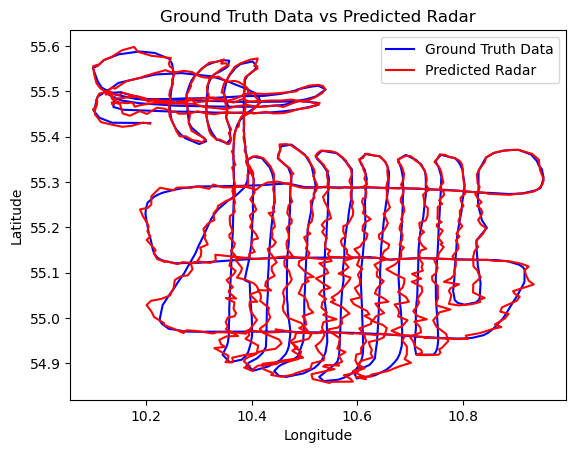

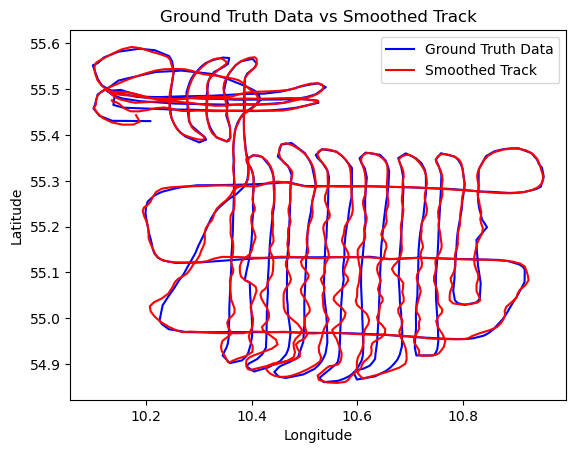

Flight FGALN_005


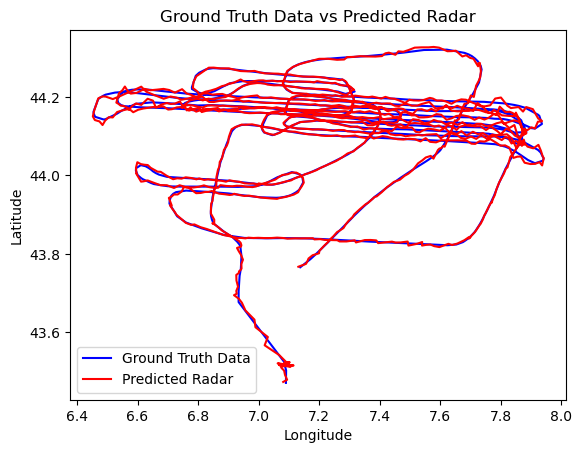

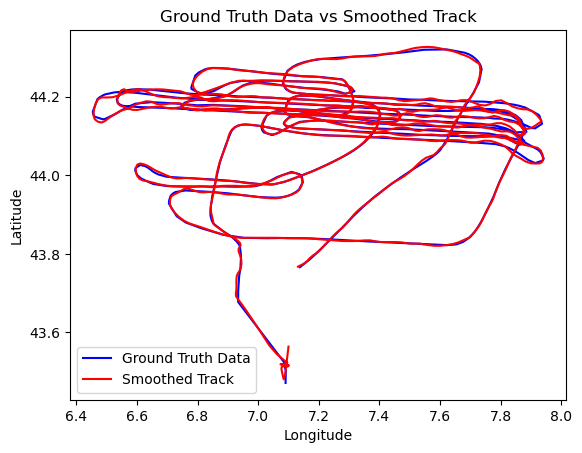

Flight FGALN_006


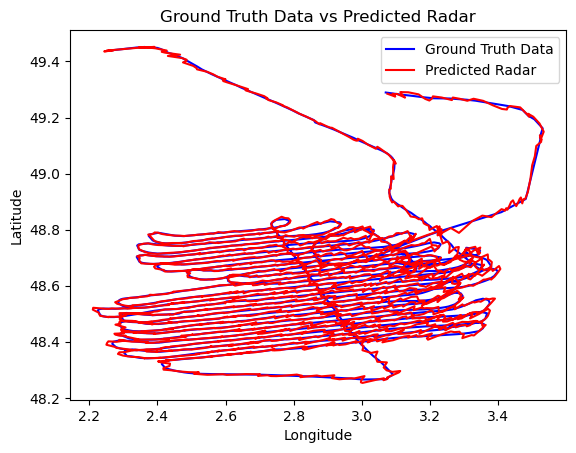

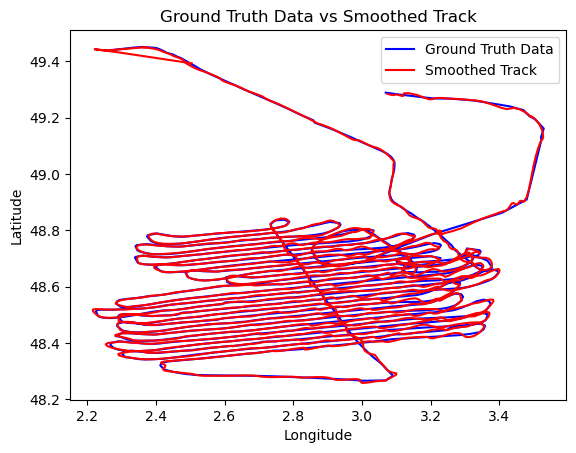

Flight HAYCG_007


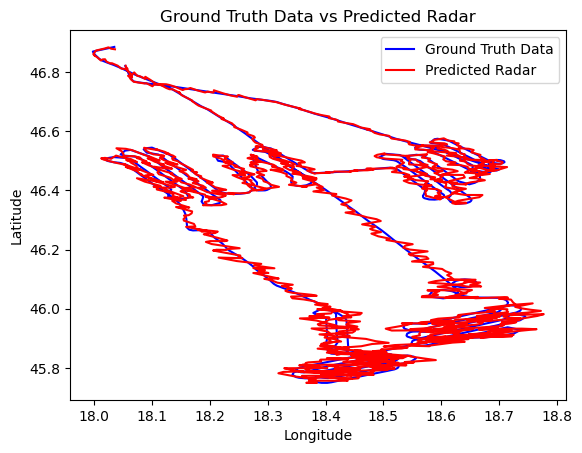

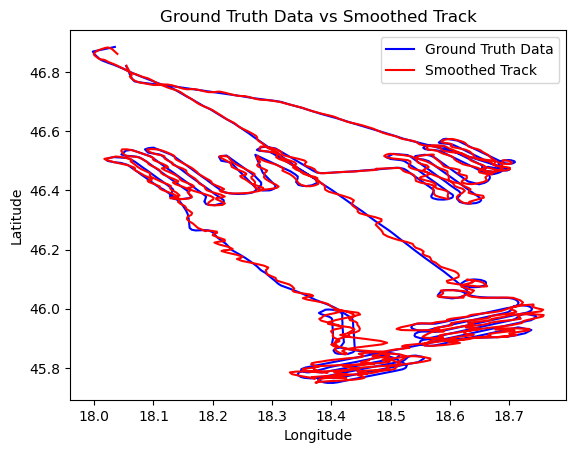

Flight FGALN_008


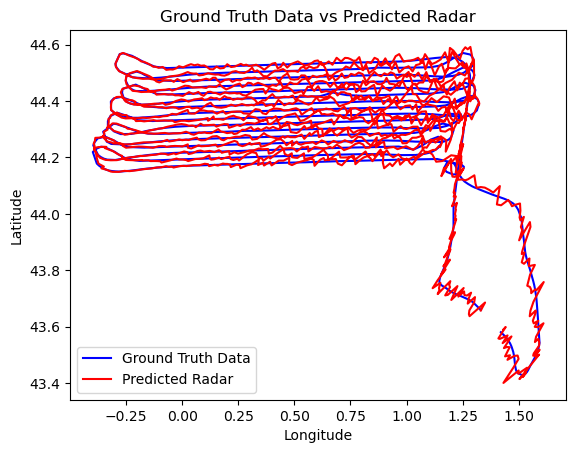

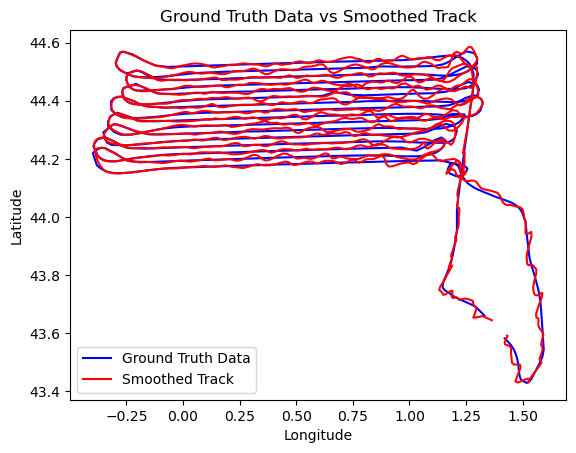

Flight FAF4011_009


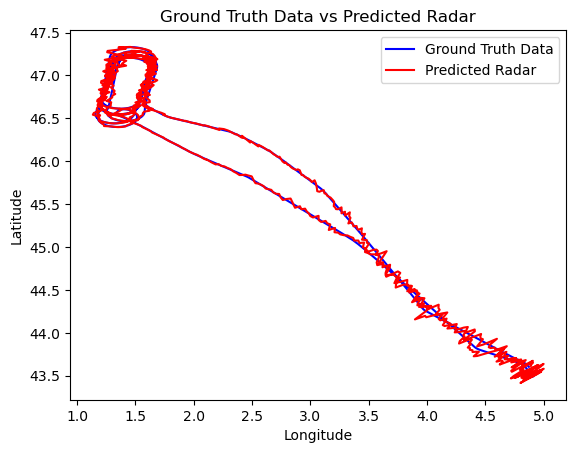

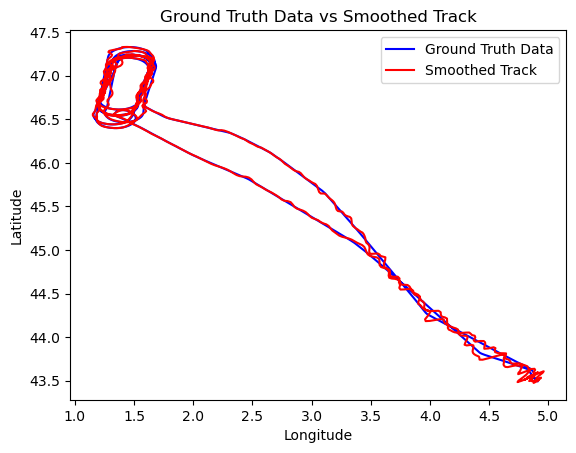

Flight PSWRD35_010


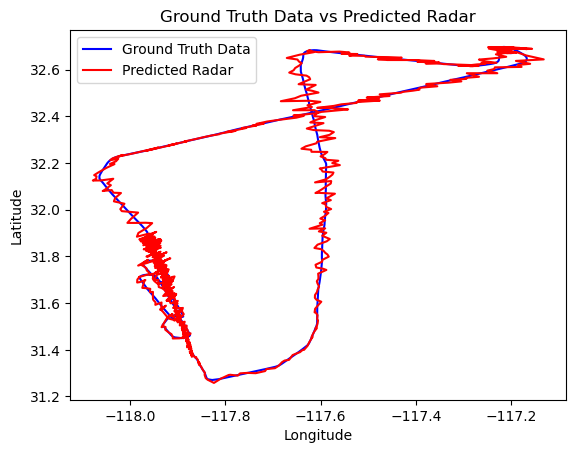

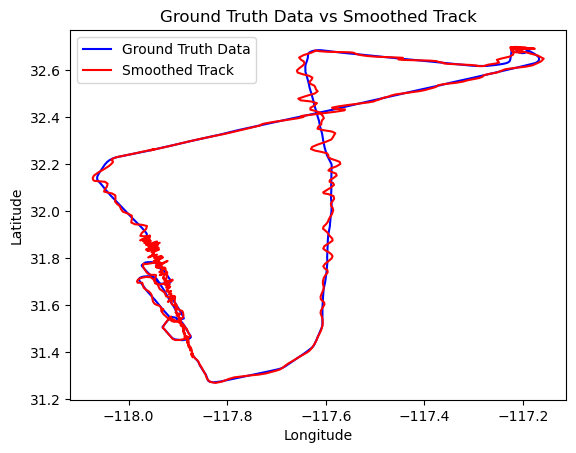

Flight F-CHDN_011


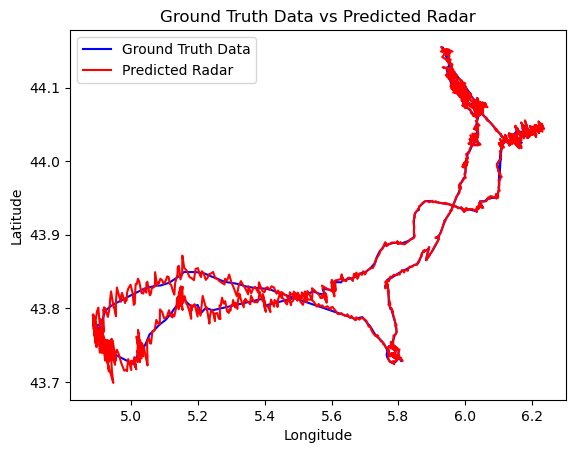

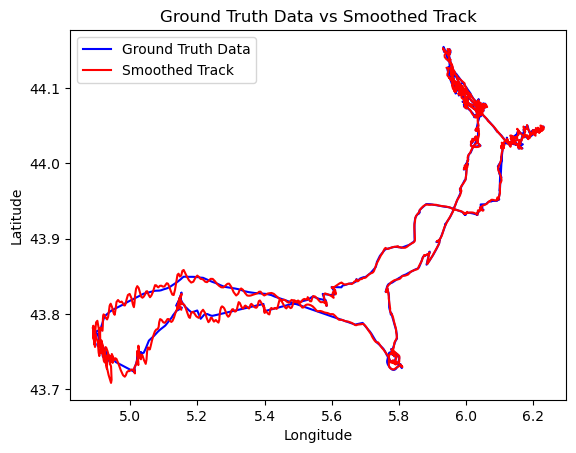

Flight D-KRPK_012


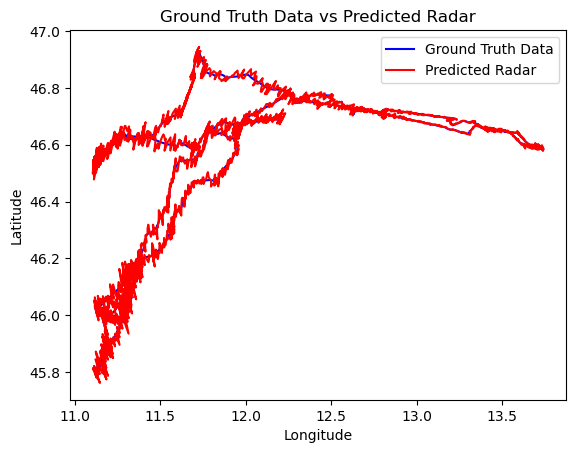

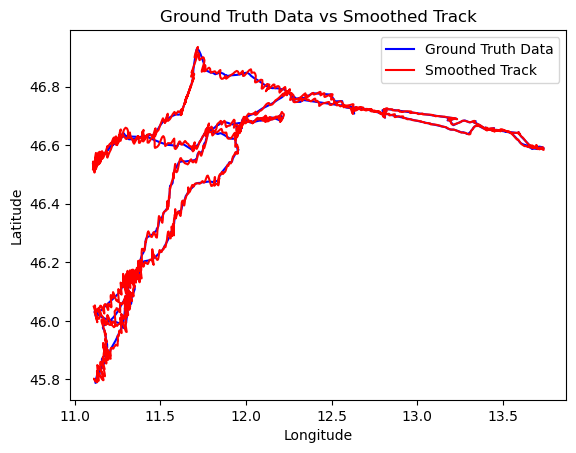

Flight D-6567_013


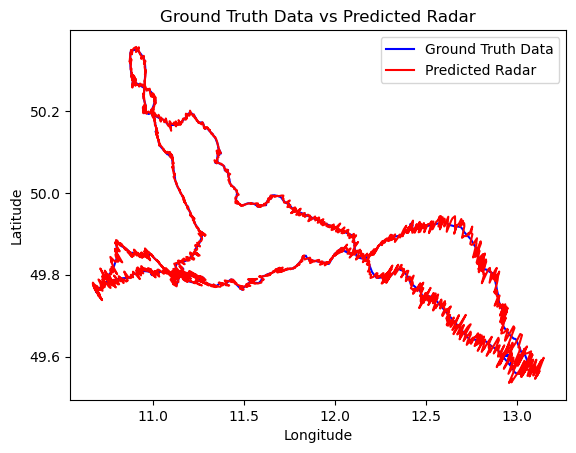

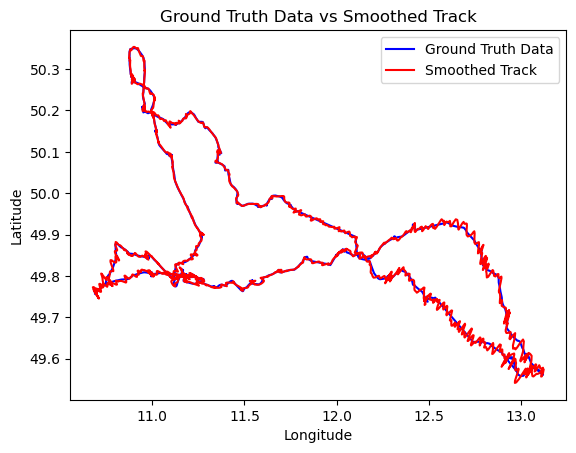

Flight SS_014


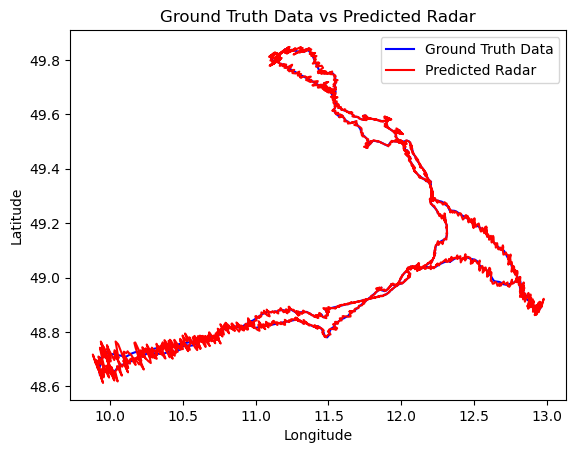

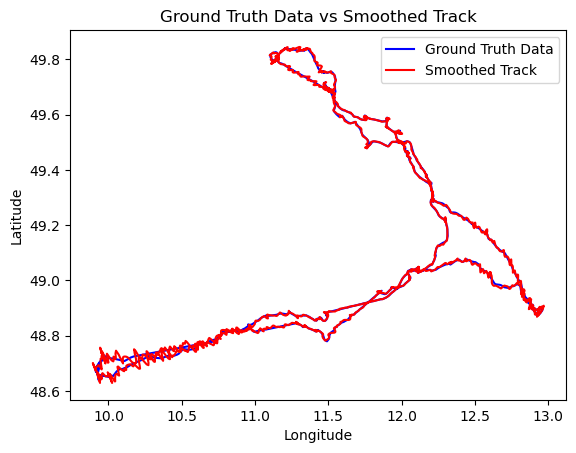

Flight F-CIJO_015


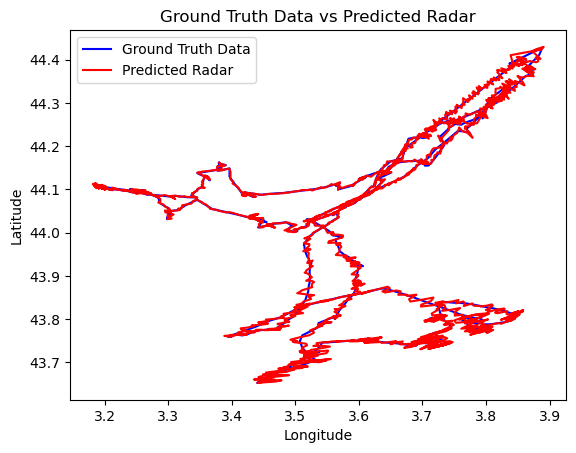

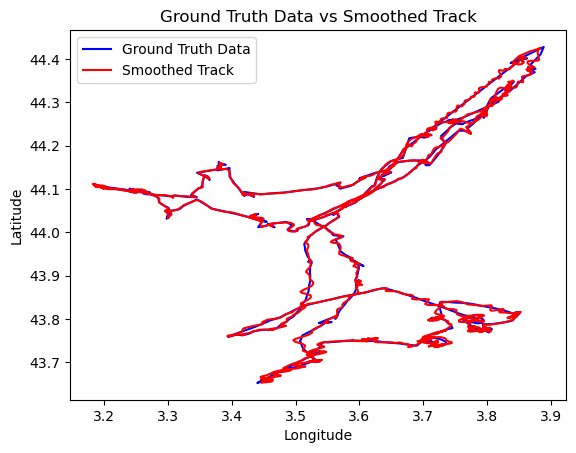

Flight G-CLPU_016


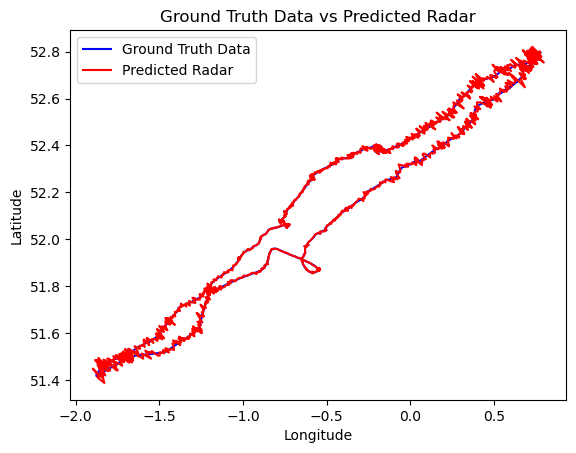

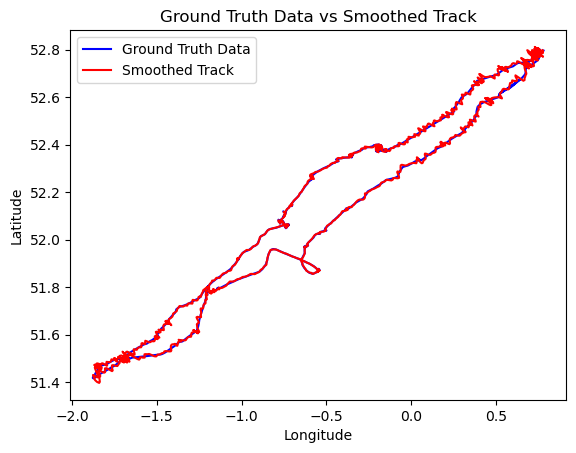

Flight D-KWFW_017


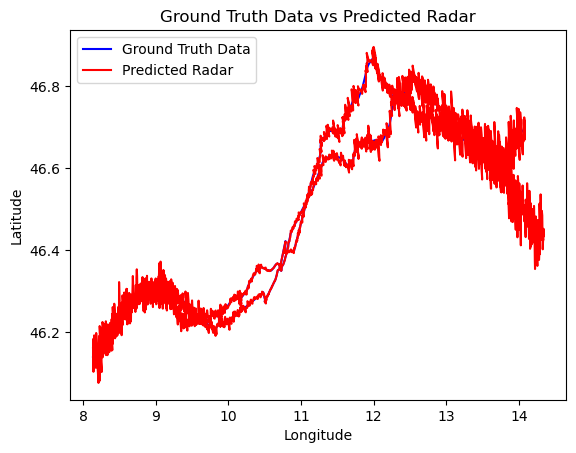

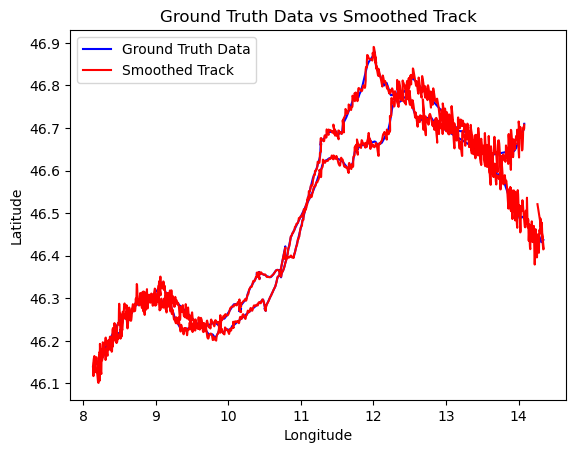

Flight REGA1_018


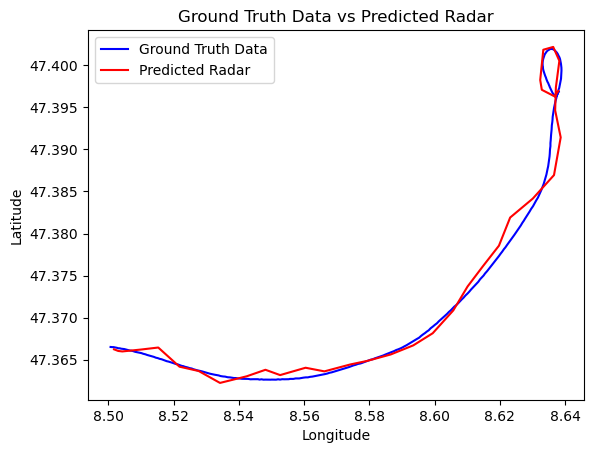

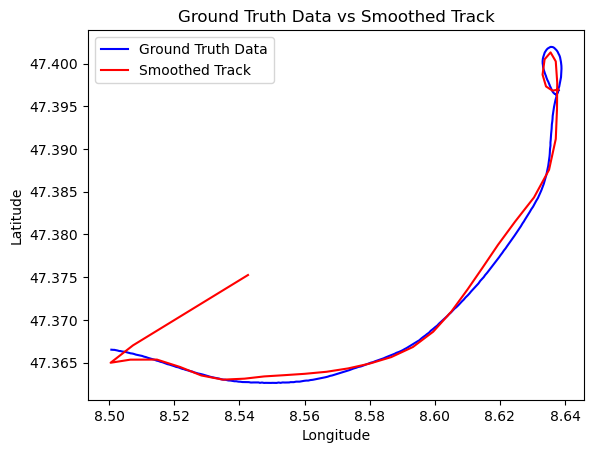

Flight SAMU31_019


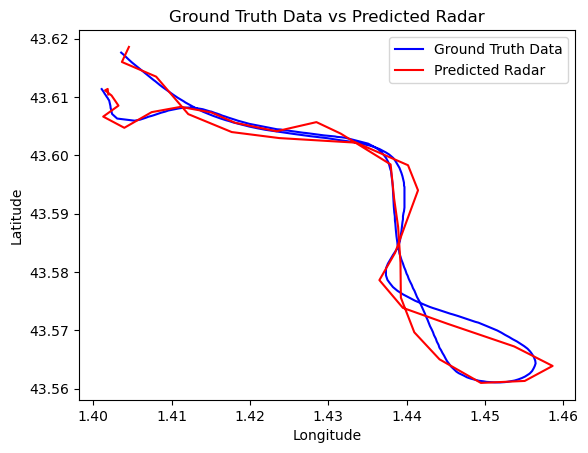

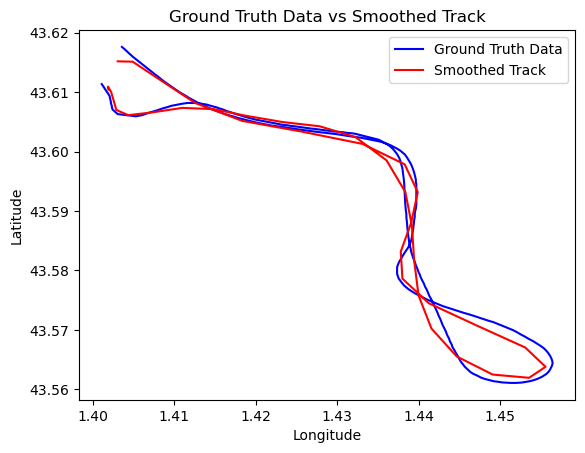

Flight REGA1_020


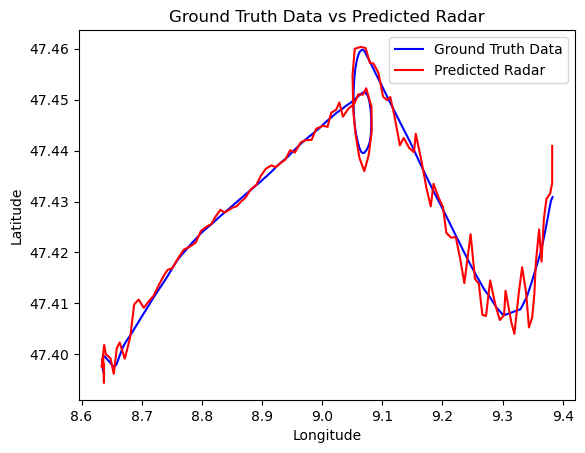

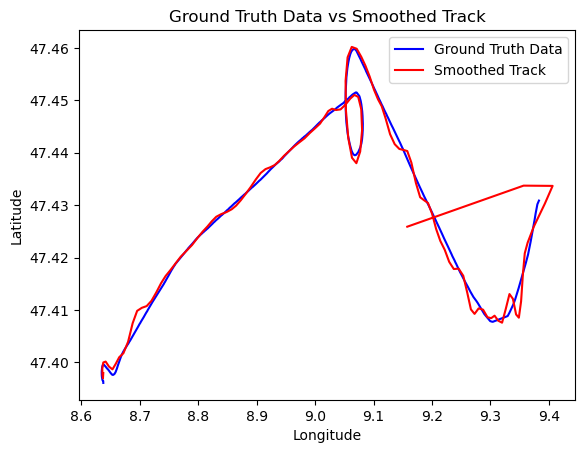

Flight CALIBRA_021


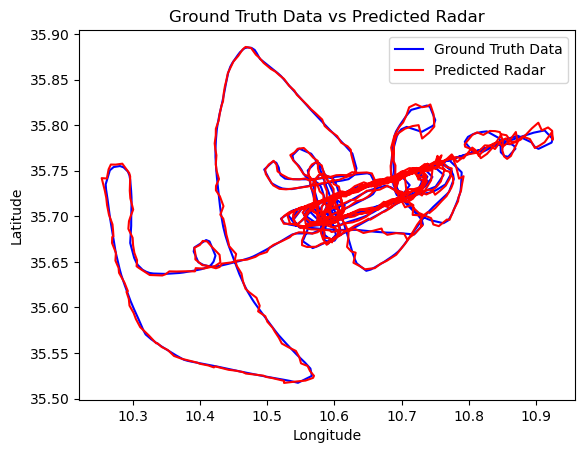

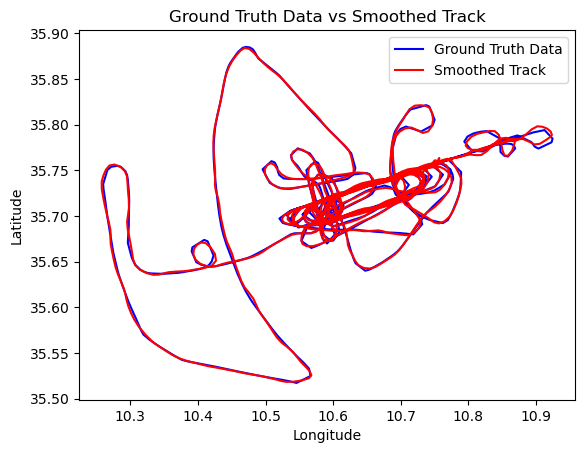

Flight YS111N_022


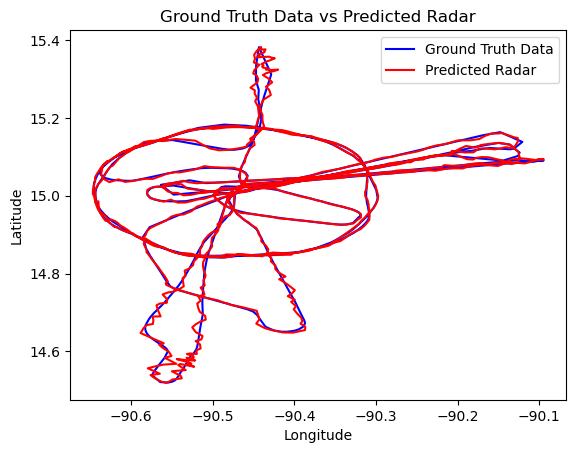

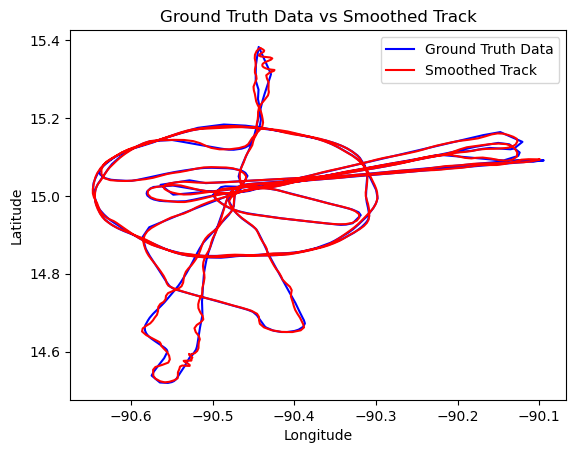

Flight VOR05_023


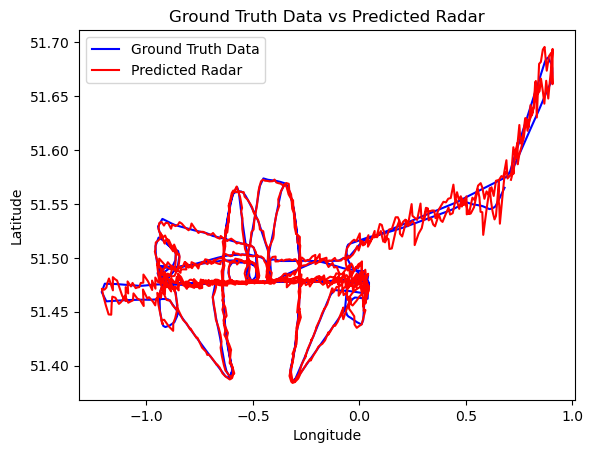

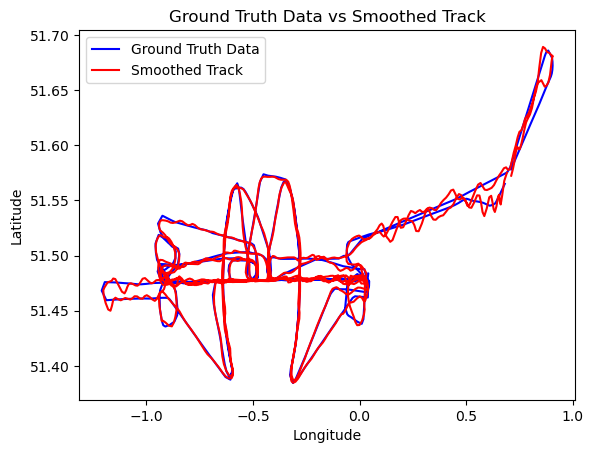

Flight GTACN_024


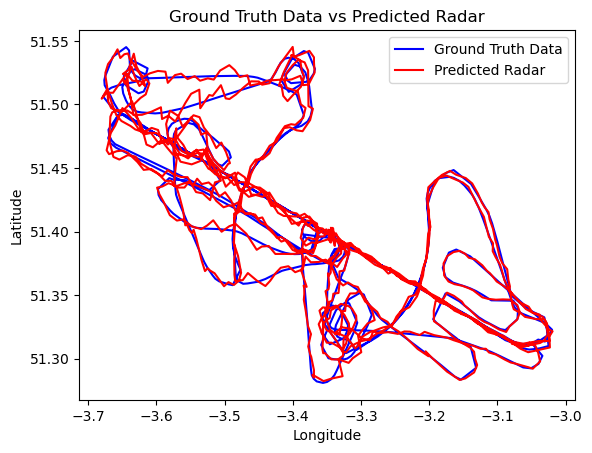

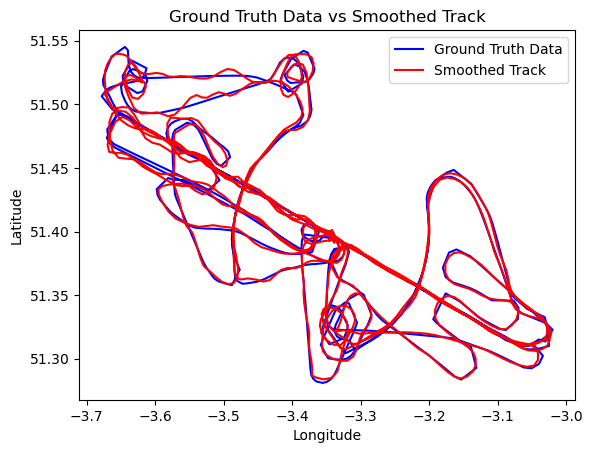

Flight ADA4_025


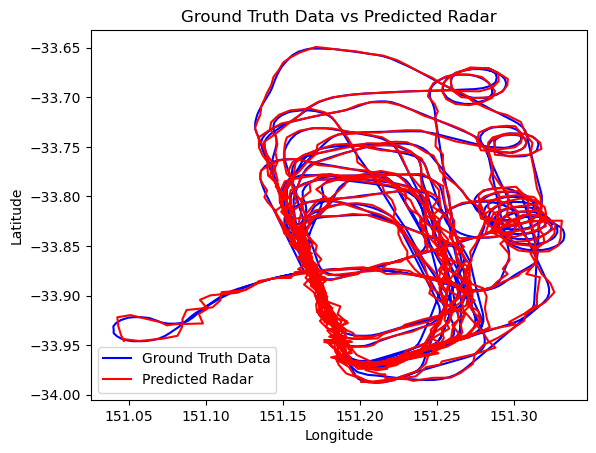

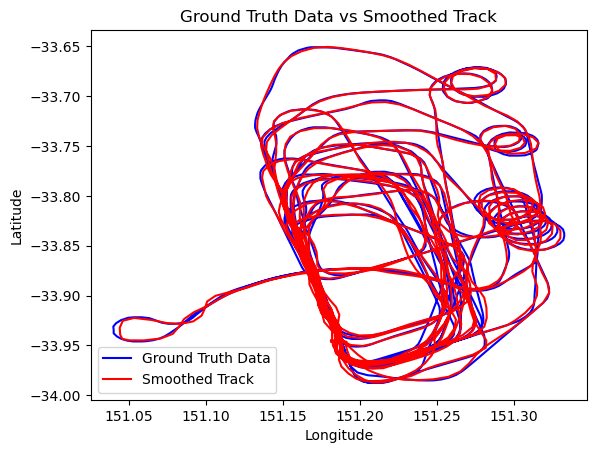

Flight CALIBRA_026


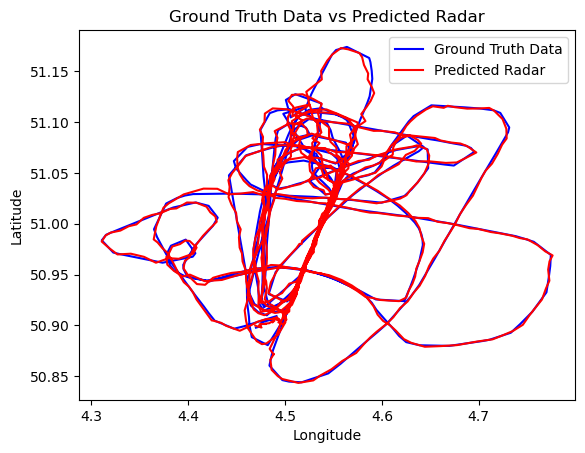

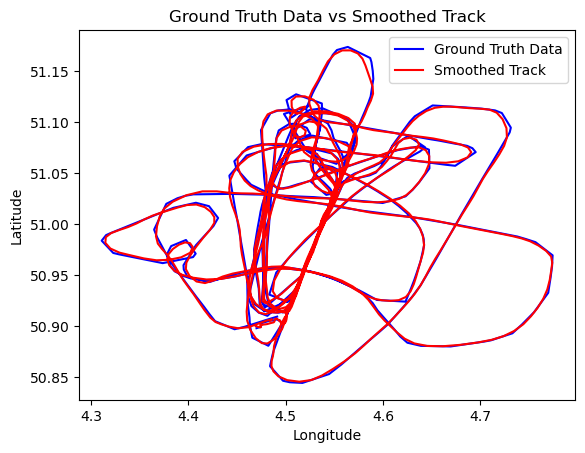

Flight CALIBRA_027


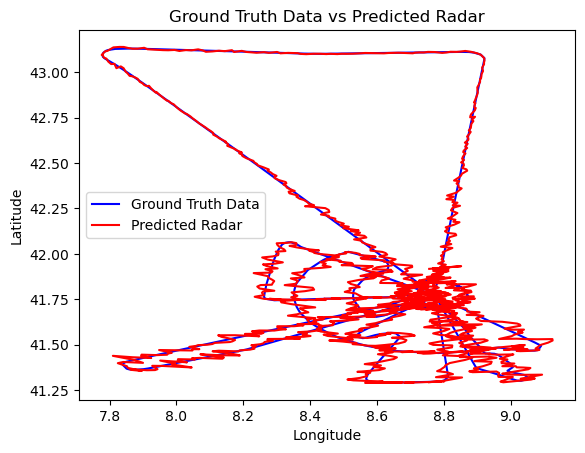

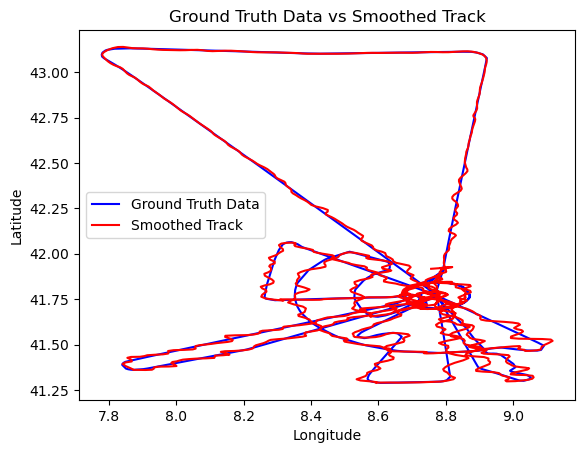

Flight CALIBRA_028


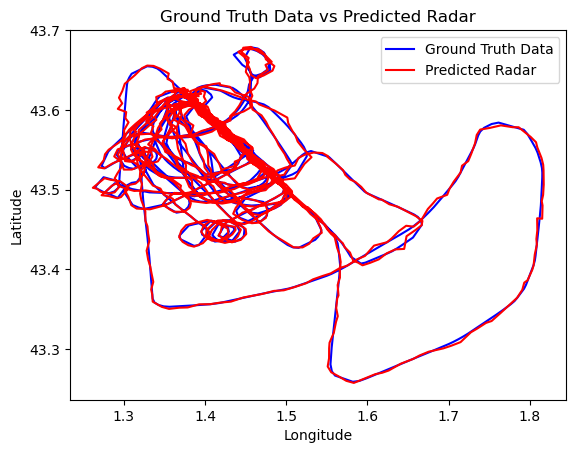

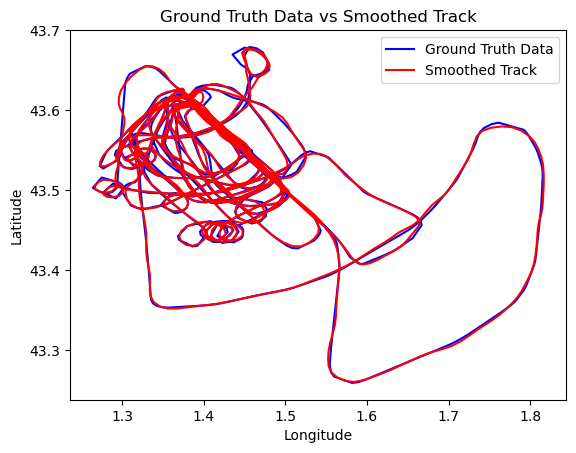

Flight CALIBRA_029


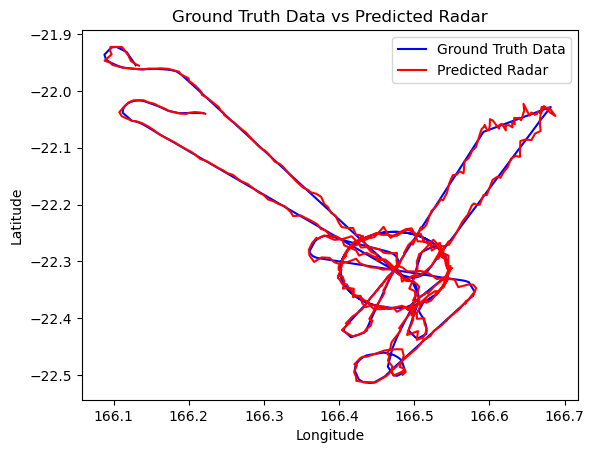

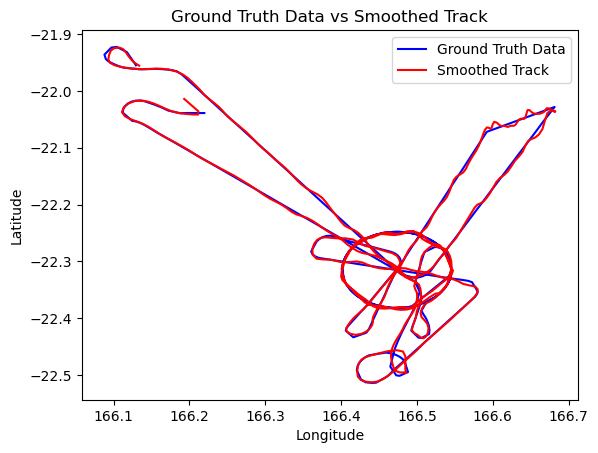

Flight GTACN_030


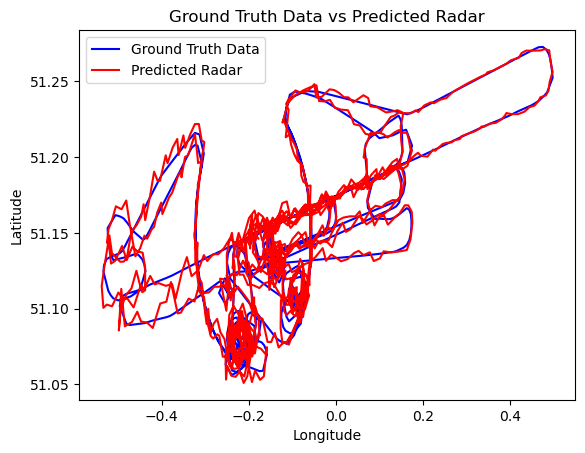

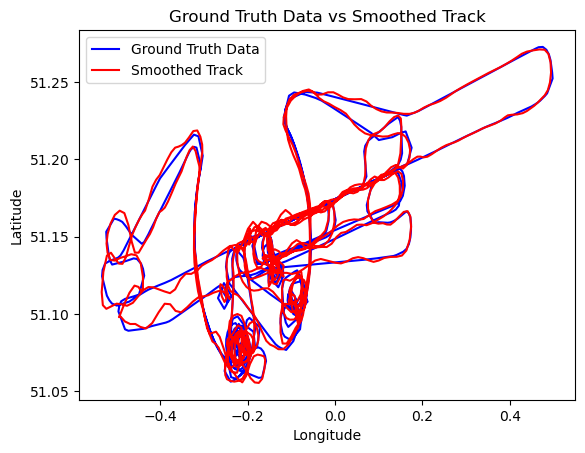

Flight ADA4_031


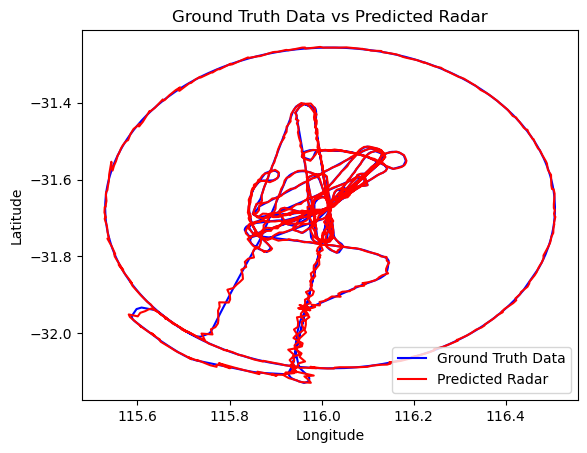

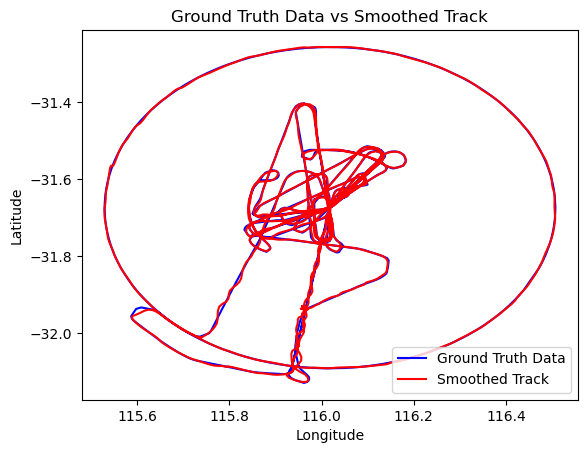

Flight 9MFCL_032


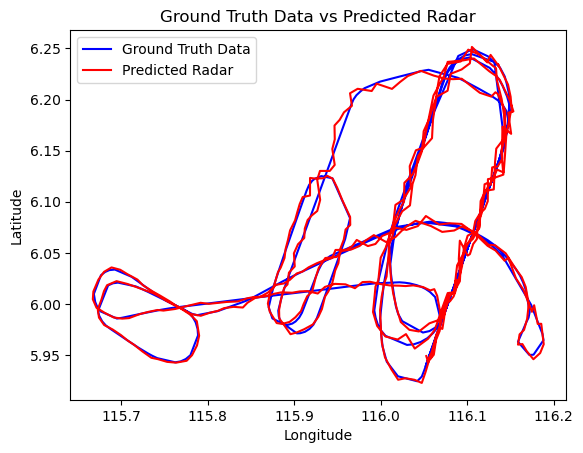

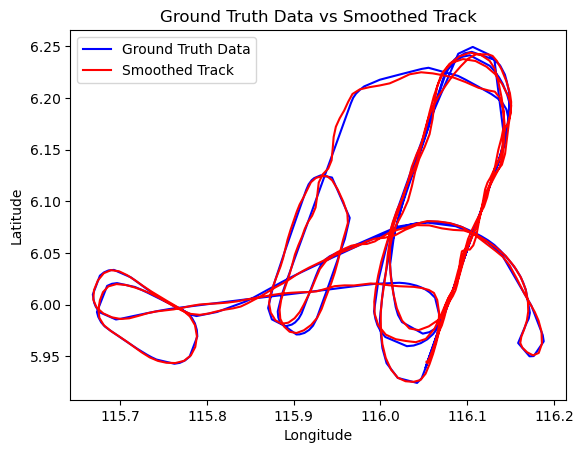

Flight NVC201_033


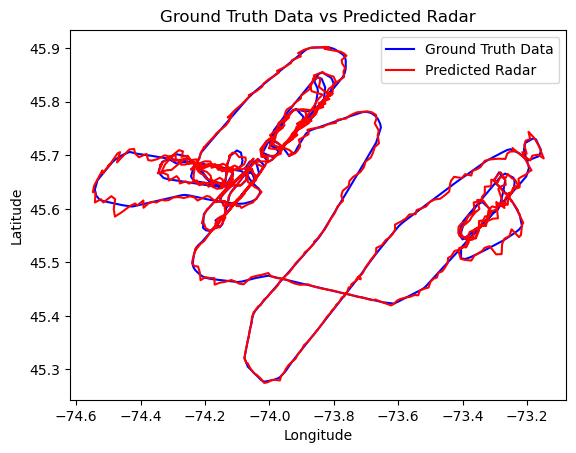

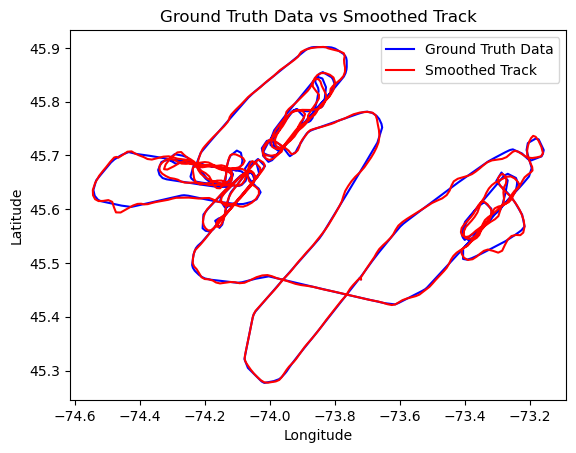

Flight VOR05_034


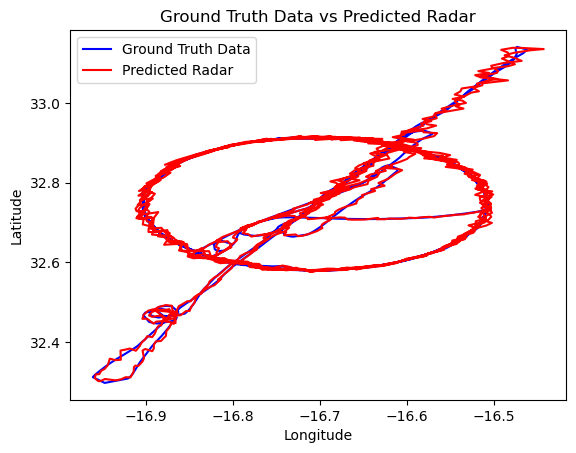

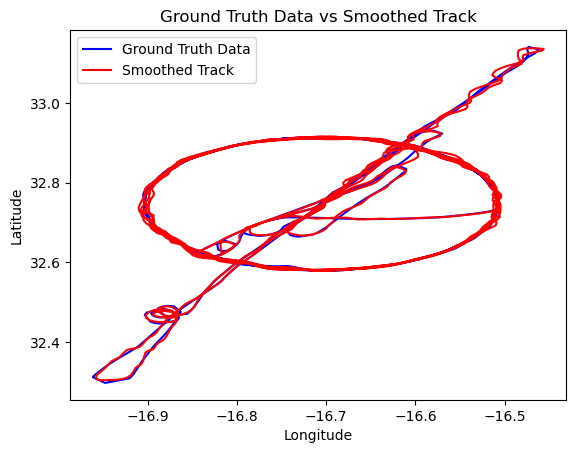

Flight CALIBRA_035


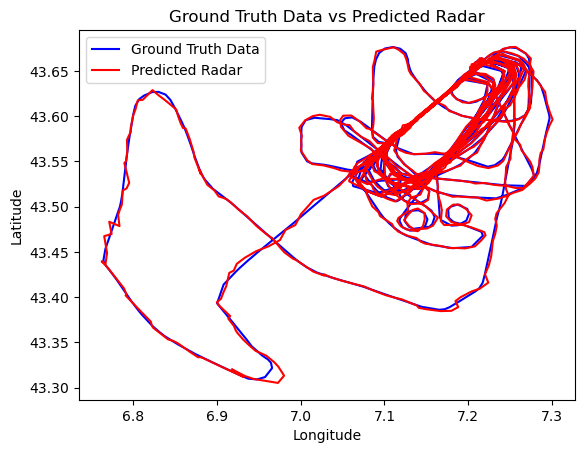

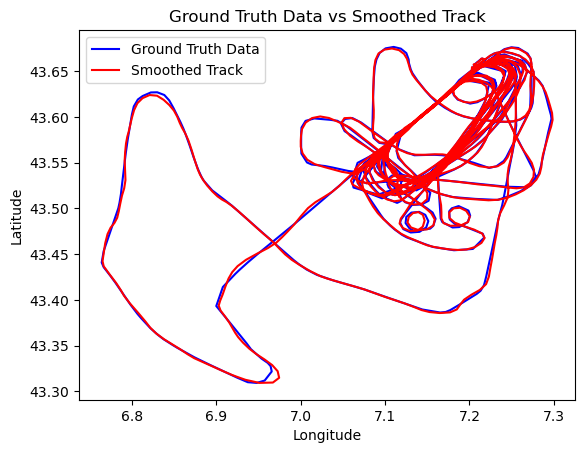

Flight FCK211_036


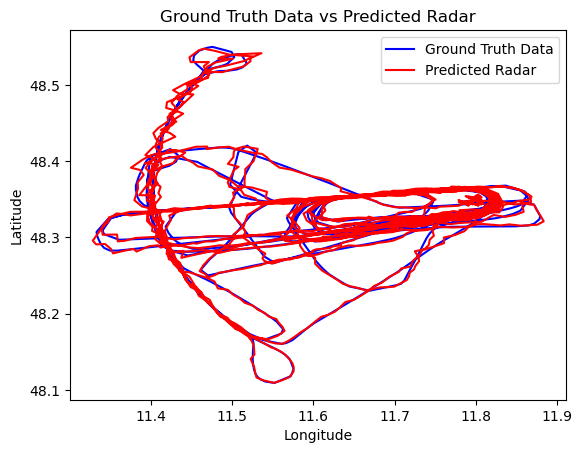

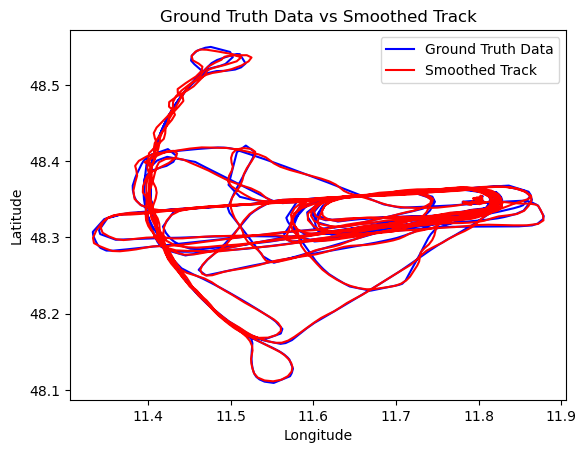

Flight NVC103_037


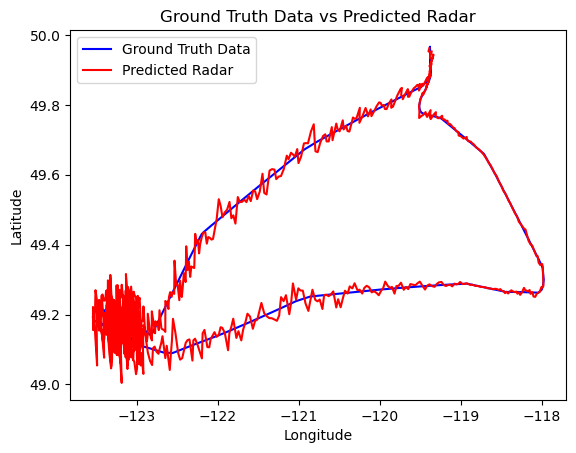

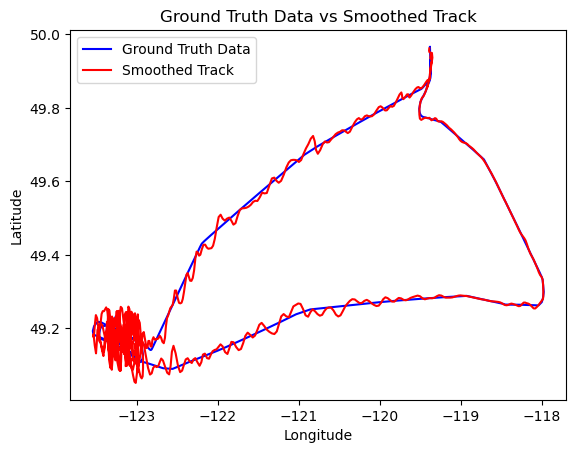

Flight VOR05_038


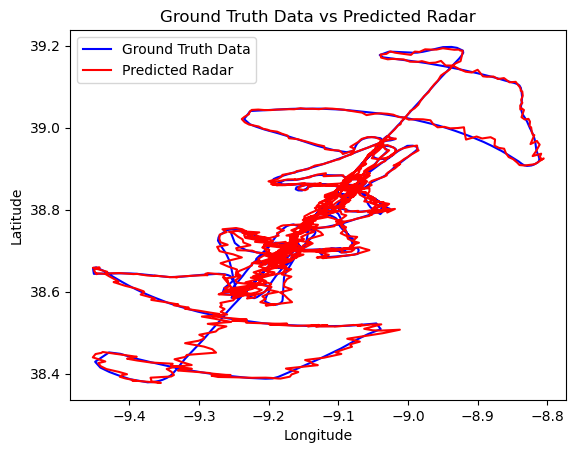

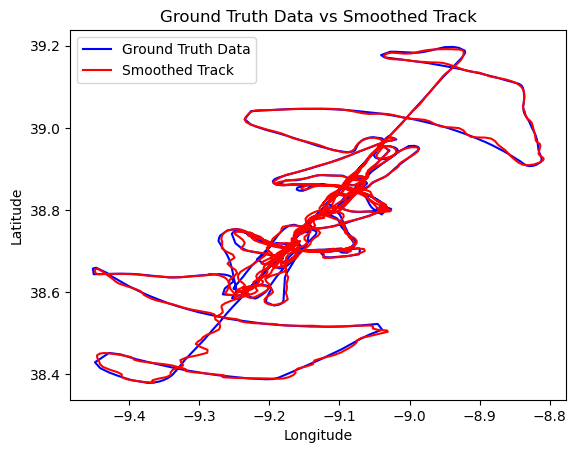

Flight CALIBRA_039


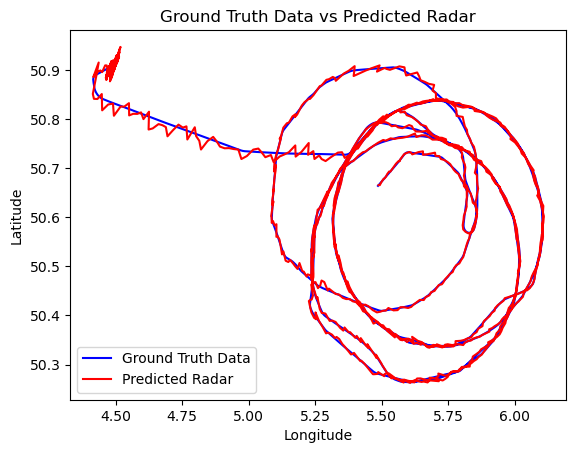

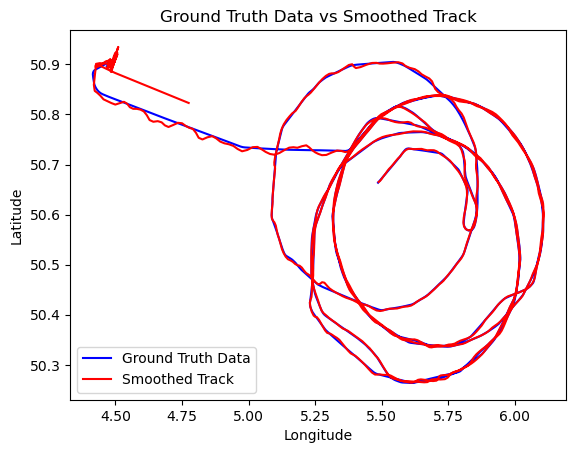

Flight CFL12_040


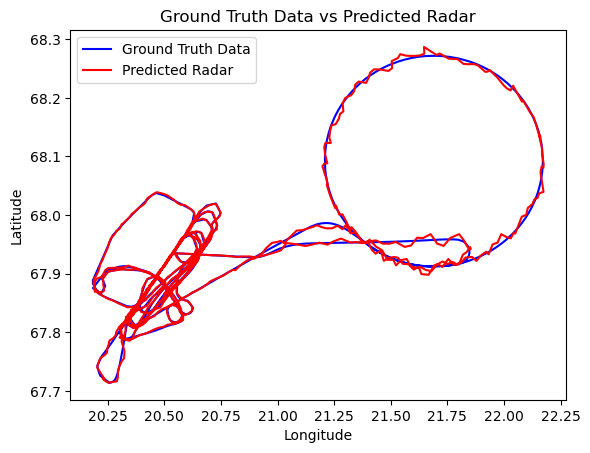

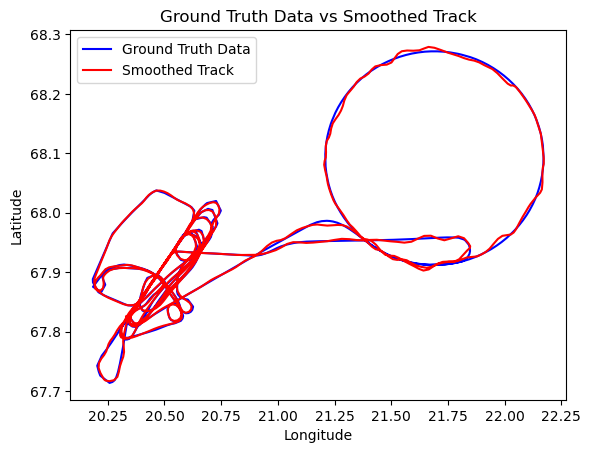

Flight CFL12_041


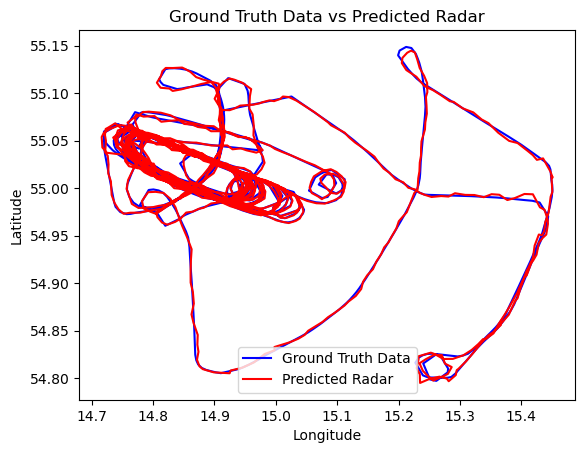

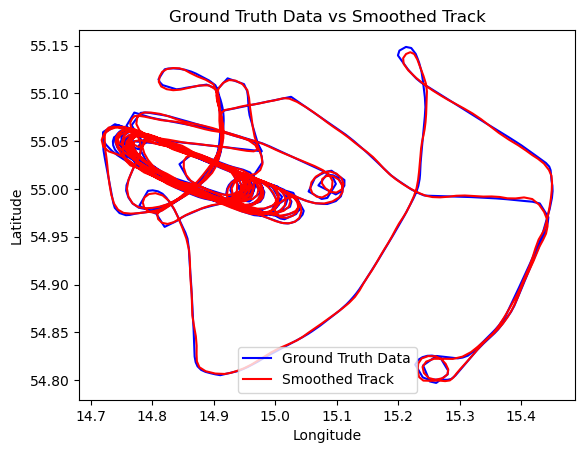

Flight YS111N_042


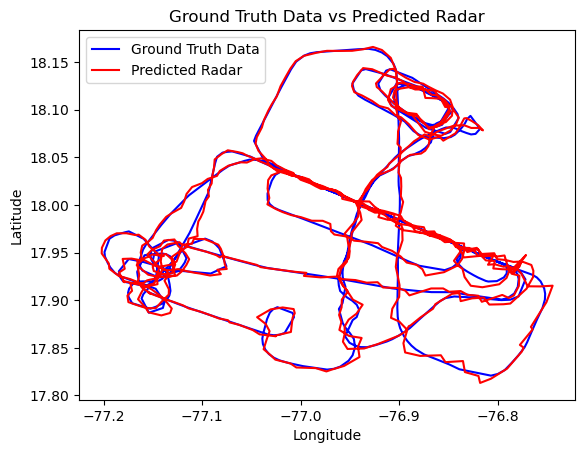

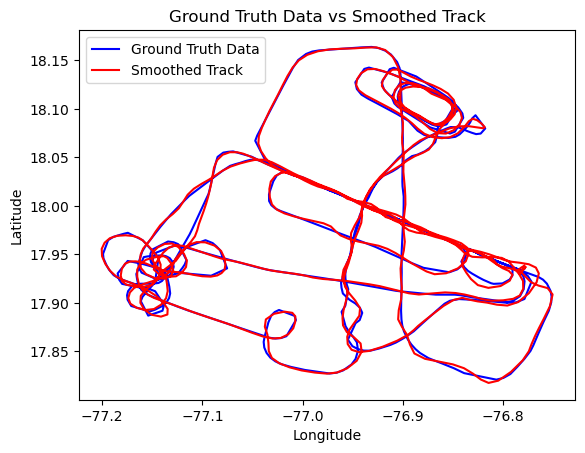

Flight CALIBRA_043


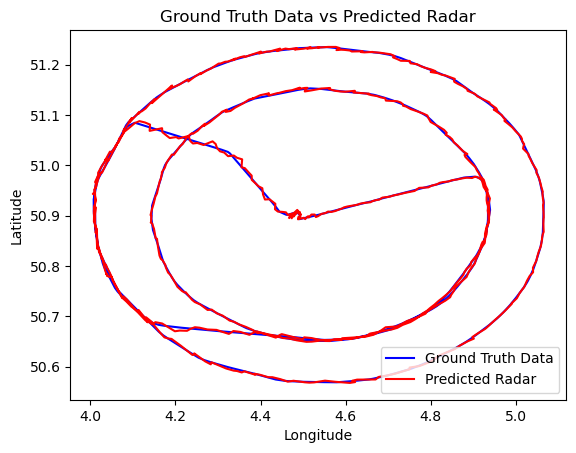

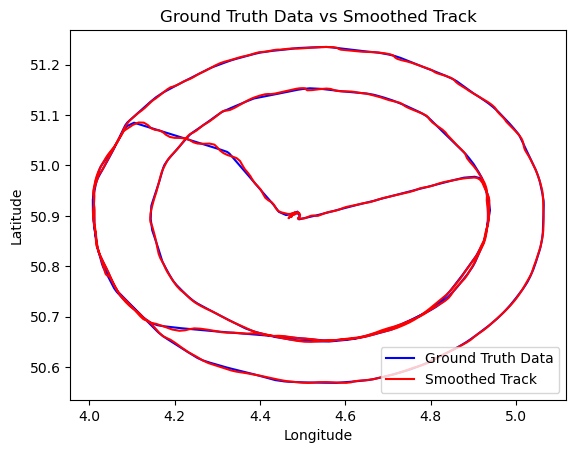

Flight FCK211_044


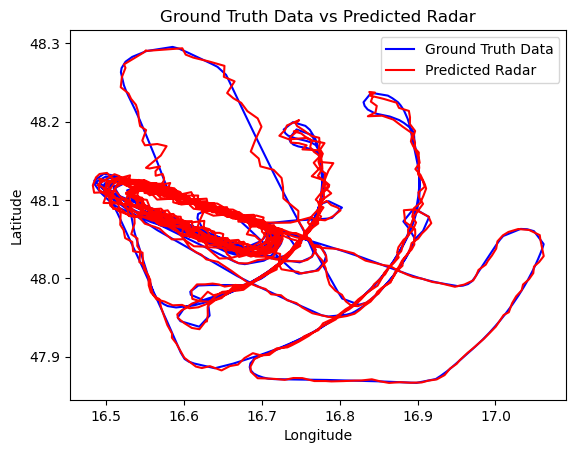

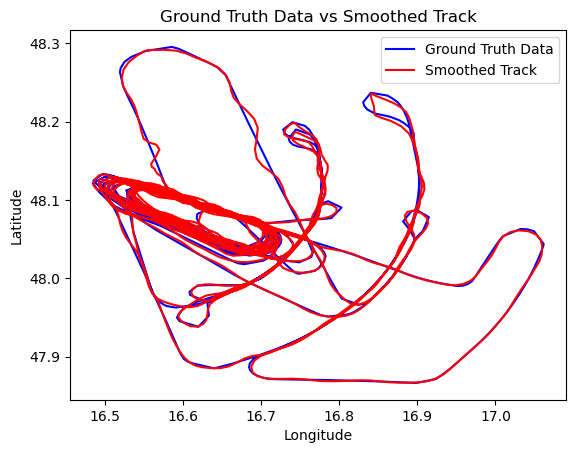

Flight GTEKV_045


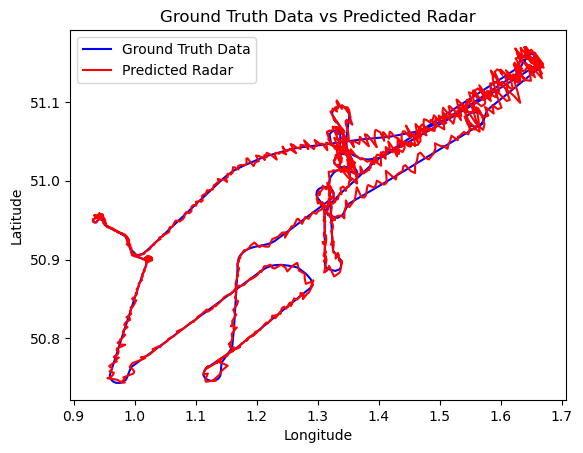

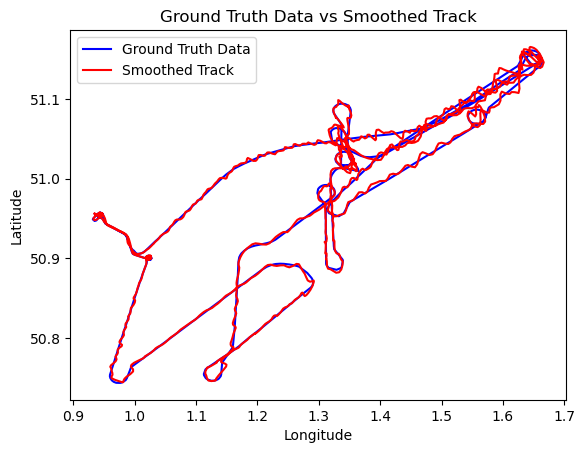

Flight BOE004_046


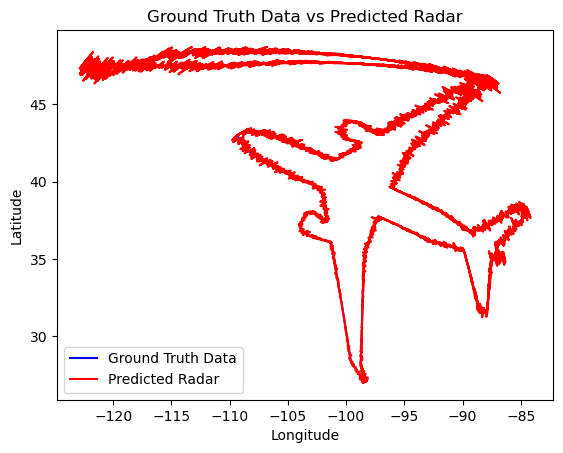

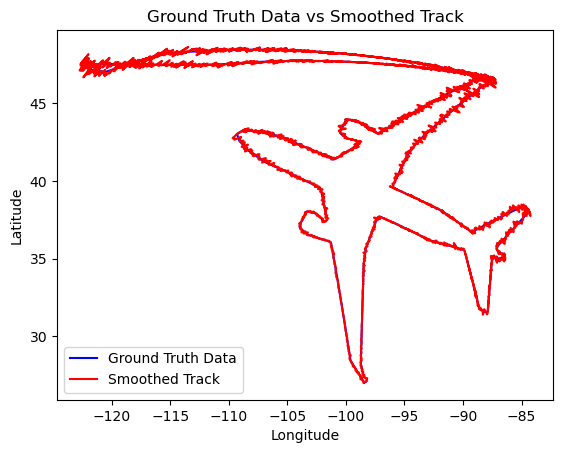

Flight N56821_047


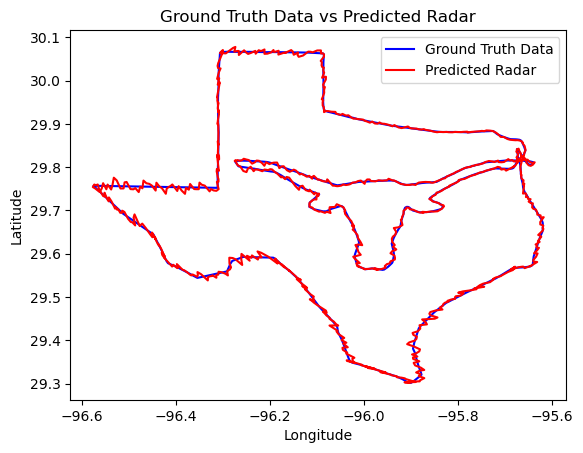

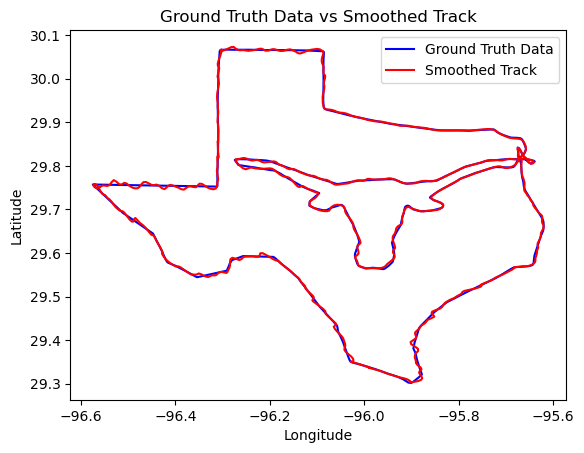

Flight ZEROG_048


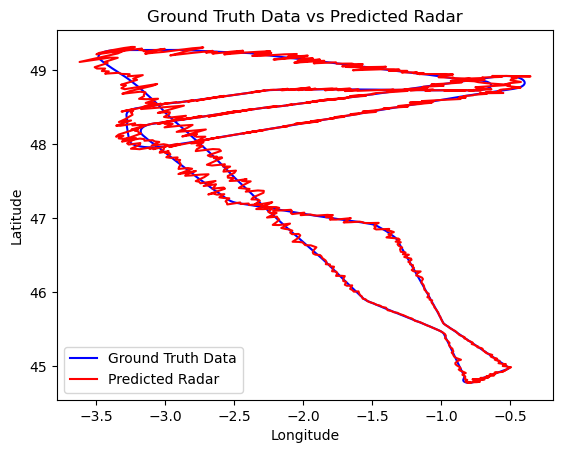

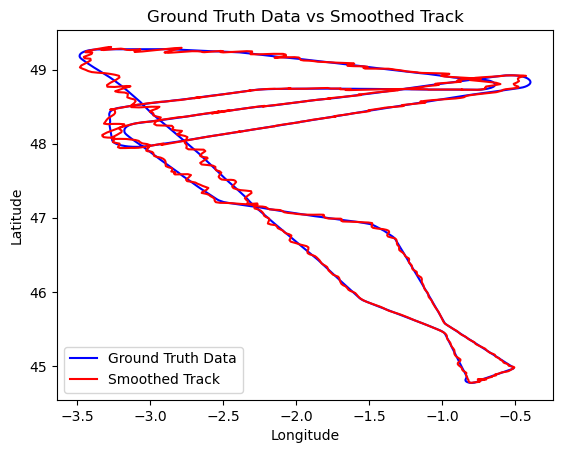

Flight QFA7474_049


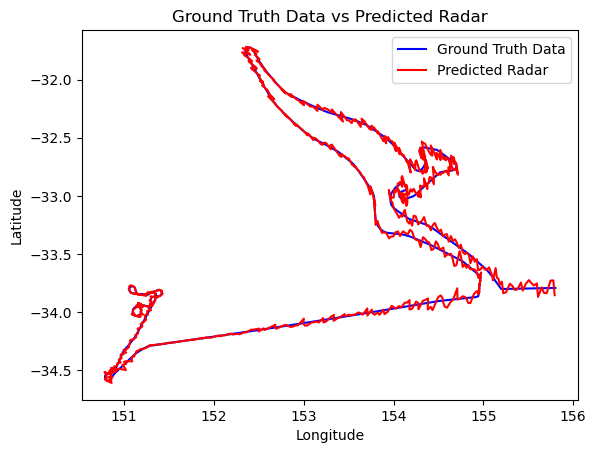

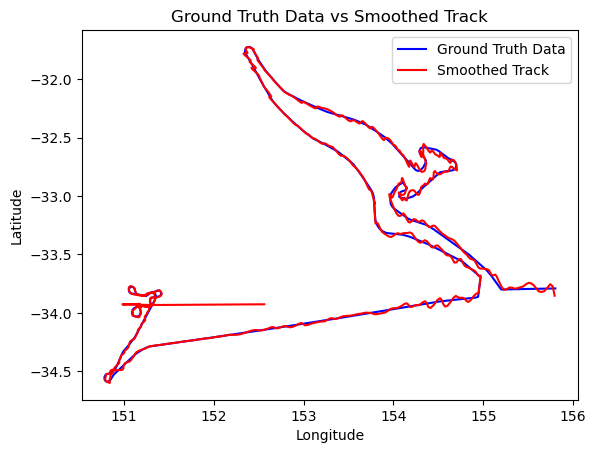

Flight THY1920_050


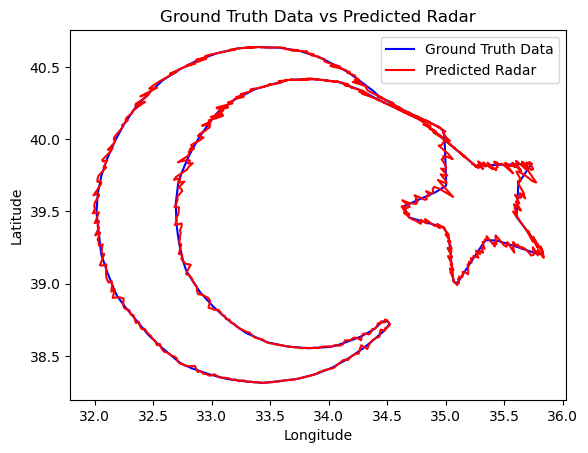

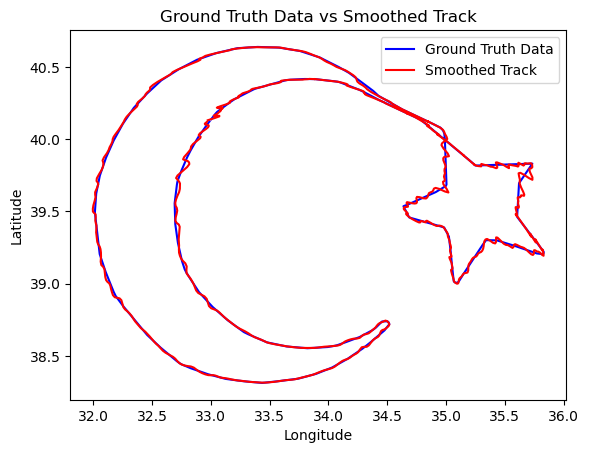

Flight AIB232E_051


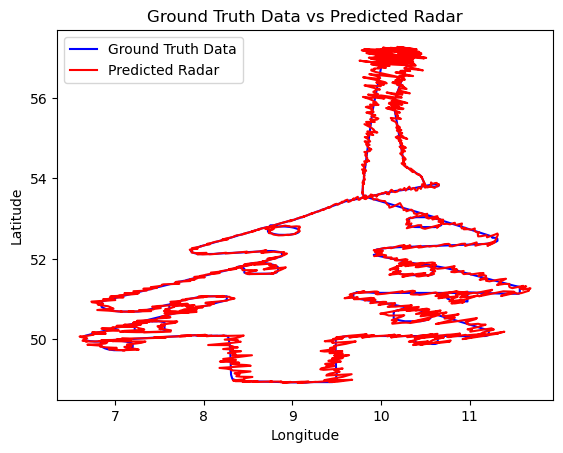

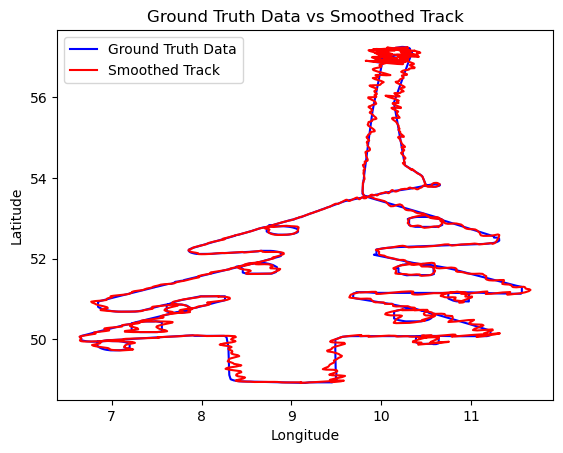

Flight DMUPY_052


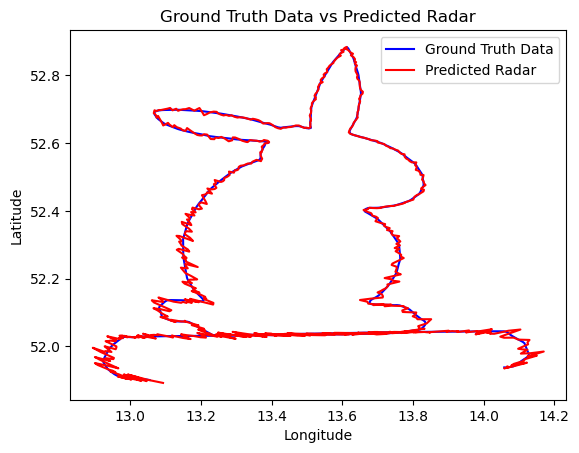

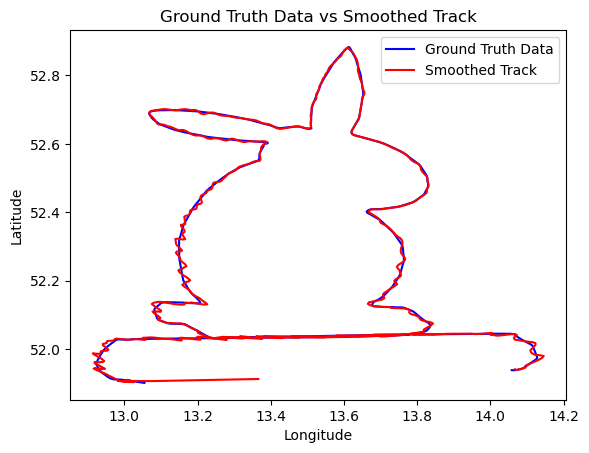

Flight TRA051_053


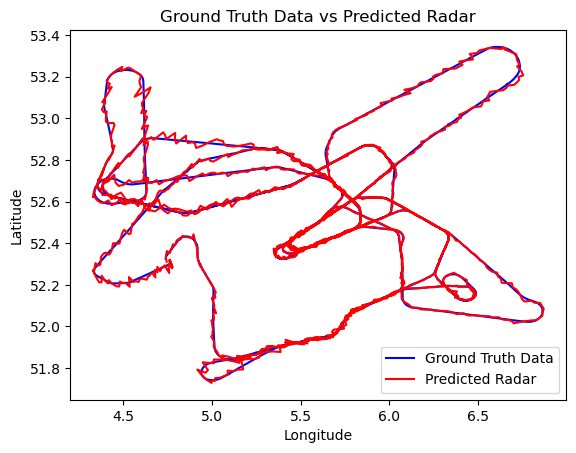

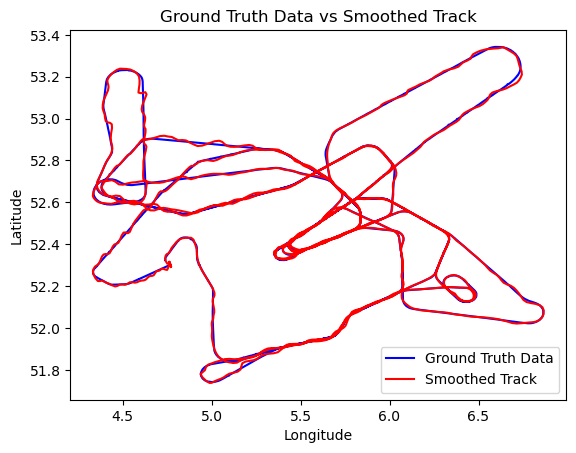

Flight VHOMS_054


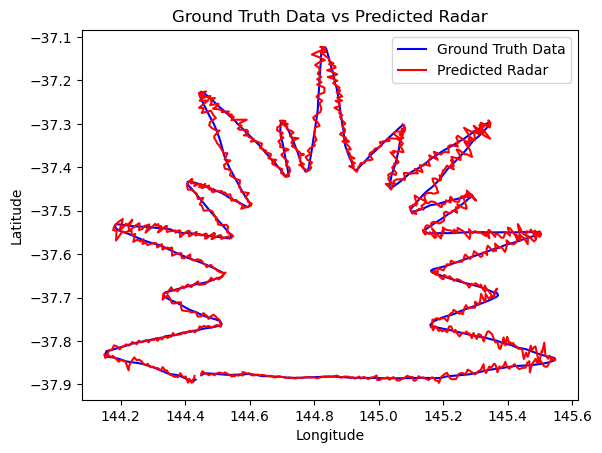

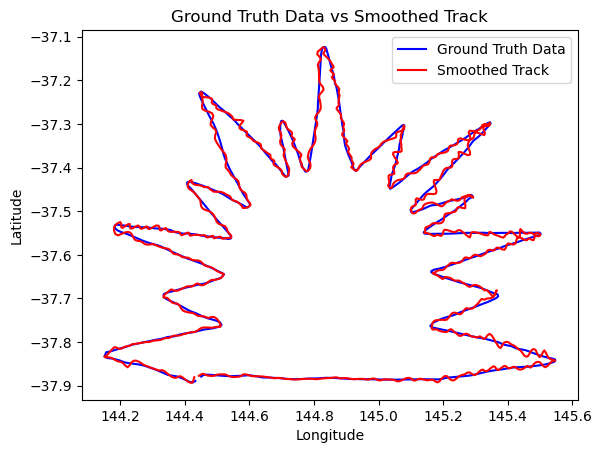

Flight HAXAE_055


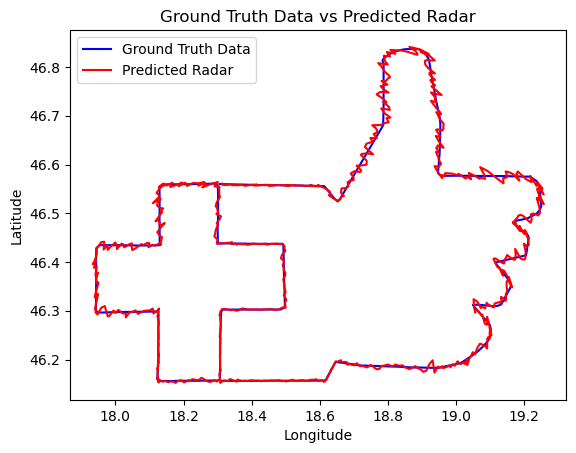

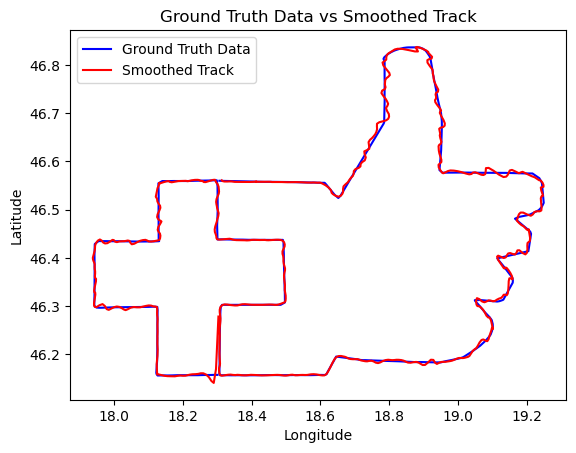

Flight OOLET_056


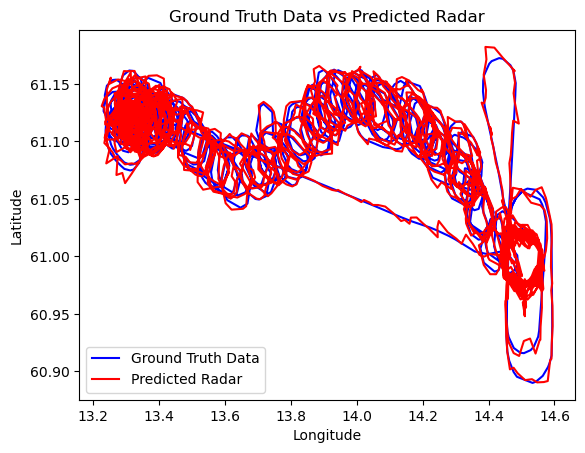

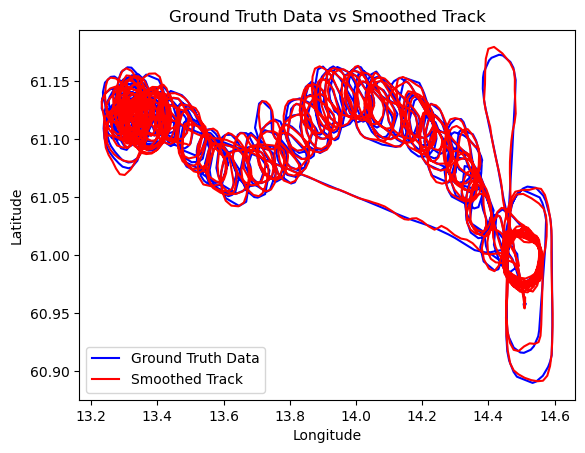

In [36]:
'''
https://filterpy.readthedocs.io/en/latest/kalman/UnscentedKalmanFilter.html?highlight=rts_smoother#filterpy.kalman.UnscentedKalmanFilter.rts_smoother
'''

# Use default parameters; original Kalman filter.
for flightID, flight in allRadarData.items():
    print(f'Flight {flightID}')
    positionX = flight.data.x[0]
    positionY = flight.data.y[0]
    velocityX = 10 # We set an initial velocity of 10
    velocityY = 10 # We set an initial velocity of 10
    x = np.array([positionX, positionY, velocityX, velocityY])
    originalKalmanFilter = buildKalmanFilter(x, zDimensions, F, P, Q, R, H)
    predictionsInXY = kalmanFilterPredictUpdateProcess(originalKalmanFilter, flight)
    predictedRadarFlight = copy.deepcopy(flight)
    
    predictedRadarFlight = updateXYFromPredictions(predictedRadarFlight, predictionsInXY)
    predictedRadarFlight = set_lat_lon_from_x_y(predictedRadarFlight, projection_for_flight)

    smoothedRadarFlight = copy.deepcopy(flight)
    measurements = getXYFromFlight(flight)
    (predictedStateMean, processCovarianceMatrix, meansPrediction, covariancePredictions) = originalKalmanFilter.batch_filter(measurements)
    
    xSmoothed, PSmoothed, KSmoother, predictedP = rts_smoother(predictedStateMean, processCovarianceMatrix, [F]*(len(measurements)-1), [Q]*(len(measurements)-1))

    smoothedRadarFlight = updateXYFromPredictions(smoothedRadarFlight, xSmoothed[:,:2])
    smoothedRadarFlight = set_lat_lon_from_x_y(smoothedRadarFlight, projection_for_flight)
    
    plotContrastFlightLongitudeLatitude(groundTruthData[flightID], predictedRadarFlight, "Ground Truth Data", "Predicted Radar") 
    plotContrastFlightLongitudeLatitude(groundTruthData[flightID], smoothedRadarFlight, "Ground Truth Data", "Smoothed Track") 
